In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

In [2]:
#Pick the PPP projects from the database
original_data = pd.read_csv(r"C:\PPP\Network for joint venture\newdata2019.csv")
data = original_data.copy()
data.drop(columns=data.columns[[0, 1]], inplace=True)
data = data.loc[data.PPP == "PPP Project"]
#drop the duplicated projects
data.drop_duplicates(subset=['ID'], keep='first', inplace=True)
data.drop(columns='PPP', inplace=True)

C:\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (32,33) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
original_data.stype.unique()

array(['Full', 'Rehabilitate, operate, and transfer',
       'Build, operate, and transfer', 'Merchant', 'Lease contract',
       'Partial', 'Build, own, and operate',
       'Build, rehabilitate, operate, and transfer',
       'Management contract', 'Rehabilitate, lease or rent, and transfer',
       'Build, lease, and transfer', 'Rental', 'Other/NA'], dtype=object)

In [4]:
data.groupby(['sector', 'ssector']).size()

sector                 ssector                 
Energy                 Electricity                 3289
                       Natural Gas                  310
ICT                    Telecom                      134
Municipal Solid Waste  Collection and Transport      93
                       Integrated MSW                47
                       Treatment/ Disposal          278
Transport              Airports                     158
                       Railroads                    140
                       Seaports                     431
                       Toll Roads                  1164
Water and sewerage     Treatment plant              659
                       Water Utility                393
dtype: int64

In [5]:
month_number = np.arange(1, 13)
month_string = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
for number, string in zip(month_number, month_string):
    data.loc[data.FCM == string, 'FCM'] = number
    
df = pd.DataFrame({'year': data.FCY,
                   'month': data.FCM,
                  'day': np.ones(data.shape[0])})
data.FCY = pd.to_datetime(df)
data.drop(columns=['FCM'], inplace=True)
data.DSU = pd.to_datetime(data.DSU)
#20140701
year_threshold= pd.to_datetime(20140701,format='%Y%m%d')
data_active = data[(data.FCY > year_threshold) & (data.status_n == 'Active')]
data_cancelled = data[data.status_n == 'Cancelled']
data_concluded = data[data.status_n == 'Concluded']
data_distressed = data[data.status_n == 'Distressed']
final_data = pd.concat([data_active, data_cancelled, data_concluded, data_distressed], ignore_index=True)

In [6]:
final_data=data_active

In [7]:
#remove nan data that is 15% more
result = (final_data.isnull().mean() >= 0.3)
result1 = []
for index, item in result.iteritems():
    if item == True:
        result1.append(index)

final_data.drop(columns = result1, inplace=True)

C:\Anaconda\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [8]:
#drop columns further.
dropped_columns = ['ID', 'name', 'capacity']
for column in dropped_columns:
    if column in final_data.columns.values:
        final_data.drop(columns = column, inplace=True)
final_data.shape

(1984, 47)

In [9]:
# preprocessig
final_data.bid_crit = final_data.bid_crit.map({'Not Available': ''})

C:\Anaconda\lib\site-packages\pandas\core\generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [10]:
#Select the data to be modeled for network
data_to_build_network = pd.read_csv(r"C:\PPP\Network for joint venture\PPP_Projects_Total-No IFC.csv")
#get the countrycode of each country
country_code = data_to_build_network[['country','countrycode']]
country_code.drop_duplicates(subset=['countrycode'],keep='first', inplace=True)
country_code.set_index('country', drop=True, inplace=True)

country_code_1 = {'Australia': 'AU', 'Austria': 'AT', 'Canada': 'CA',
                 'Chile': 'CL', 'Czech Republic': 'CZ', 'Denmark': 'DK',
                 'Finland': 'FI', 'France': 'FR', 'Germany': 'DE', 
                 'Greece': 'GR', 'Ireland': 'IE', 'Israel': 'IL',
                 'Italy': 'IT', 'Japan': 'JP', 'Korea': 'KP',
                 'Netherlands': 'NL', 'New Zealand': 'NZ', 'Norway': 'NO',
                 'Portugal': 'PT', 'Saudi Arabia': 'SA', 'IFC': 'IFC',
                 'Singapore': 'SG', 'Spain': 'ES', 'Sweden': 'SE',
                 'Switzerland': 'CH', 'UK': 'GB', 'US': 'US',
                 'United Arab': 'AE', 'World Bank': 'WB', 'Belgium': 'BE',
                 'DBS': 'DBS', 'ADB': 'ADB', 'EIB': 'EIB', 'Kuwait': 'KW',
                 'AIIM': 'AIIM', 'EBRD': 'EBRD', 'Cyprus': 'CY'}
other_code = pd.DataFrame(list(country_code_1.values()), index=list(country_code_1.keys()), columns=['countrycode'])
country_code = country_code.append(other_code)
country_code.index.name = 'country'

data_for_network = data_to_build_network[['IY', 'country', 'Region', 'sector', 'ssector', 'PCO']]
data_for_network.loc[:, 'PCO'] = data_for_network['PCO'].str.replace('\n', '') 

# remove nan and missing value.
data_for_network = data_for_network.dropna()
data_for_network = data_for_network[data_for_network.PCO !='']

C:\Anaconda\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Anaconda\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [11]:
data_for_network.shape

(4932, 6)

In [12]:
data_for_network['government_involve'] = data_for_network['PCO'].str.split('/').map(lambda x: x[0])
data_for_network['foreign_country'] = data_for_network['PCO'].str.split('/').map(lambda x: x[1])
data_for_network['sponsor_number'] = data_for_network['PCO'].str.split('/').map(lambda x: x[2])
data_for_network['foreign_fund'] = data_for_network.loc[data_for_network['PCO'].str.count('/')>2, 'PCO'].str.split('/').map(lambda x: x[3])
#replace string "N" in column with np.nan
#data_for_network.replace({'foreign_country': 'N'}, np.nan, inplace=True)

In [13]:
data_for_network

,IY,country,Region,sector,ssector,PCO,government_involve,foreign_country,sponsor_number,foreign_fund
0,1990,Argentina,LAC,Transport,Toll Roads,N/N/6,N,N,6,NaN
2,1990,Thailand,EAP,Transport,Seaports,N/N/4,N,N,4,NaN
3,1990,Thailand,EAP,ICT,Telecom,N/N/1,N,N,1,NaN
4,1990,Mexico,LAC,Transport,Toll Roads,N/N/3/Local Bank,N,N,3,Local Bank
5,1990,Mexico,LAC,Transport,Toll Roads,N/N/7,N,N,7,NaN
...,...,...,...,...,...,...,...,...,...,...
7091,2019,China,EAP,Water and sewerage,Treatment plant,Y/N/3,Y,N,3,NaN
7092,2019,China,EAP,Water and sewerage,Treatment plant,N/N/1,N,N,1,NaN
7093,2019,Turkey,ECA,Energy,Electricity,N/N/1,N,N,1,NaN
7094,2019,Turkey,ECA,Energy,Electricity,N/N/1,N,N,1,NaN


In [14]:
data_for_network_copy = data_for_network.copy()

In [15]:
gg = data_for_network_copy[data_for_network_copy.foreign_country!='N']

In [16]:
year_gg = np.arange(1990, 2020)

In [17]:
# the number of countries that involve foreign countries.
for i in year_gg:
    tt = gg1[gg1.index == i]
    m = tt.country.unique().size
    print(m)

NameError: name 'gg1' is not defined

In [19]:
gg2 = gg.groupby(['IY', 'foreign_country']).size().to_frame().reset_index(level='foreign_country')

In [20]:
gg2['n'] = gg2['foreign_country'].map(lambda x: x.count(',')) + 1

In [21]:
# the number of countries that involve foreign countries.
for i in year_gg:
    tt = gg2[gg2.index == i]
    print(tt.n.sum() / tt.shape[0])

1.0
1.0
1.5
1.25
1.6666666666666667
1.4074074074074074
1.5333333333333334
1.46875
1.3103448275862069
1.8
1.5666666666666667
1.5666666666666667
1.1818181818181819
1.6486486486486487
1.2666666666666666
1.5384615384615385
1.3225806451612903
1.46875
1.5135135135135136
1.457142857142857
1.4285714285714286
1.5172413793103448
1.5512820512820513
1.4444444444444444
1.5
1.5454545454545454
1.3703703703703705
1.574468085106383
1.2580645161290323
1.4782608695652173


In [22]:
i = 0
for country in data_for_network.foreign_country.values:
    if country != 'N':
        i = i+1
print(i)

2208


In [18]:
project_with_foreign_country = data_for_network[data_for_network.foreign_country != 'N']

In [19]:
project_with_foreign_country[project_with_foreign_country.IY==1991]

,IY,country,Region,sector,ssector,PCO,government_involve,foreign_country,sponsor_number,foreign_fund
16,1991,China,EAP,Transport,Toll Roads,Y/US/2,Y,US,2,NaN
17,1991,Argentina,LAC,Water and sewerage,Water Utility,N/UK/2/Local Bank,N,UK,2,Local Bank
21,1991,Russia,ECA,ICT,Telecom,N/France/4,N,France,4,NaN
4652,1991,Philippines,EAP,Energy,Electricity,Y/UK/2,Y,UK,2,NaN
4654,1991,Central African Republic,AFR,Water and sewerage,Water Utility,N/France/3,N,France,3,NaN
4874,1991,Madagascar,AFR,Transport,Airports,N/France/1,N,France,1,NaN
4876,1991,Guinea-Bissau,AFR,Energy,Electricity,N/France/2,N,France,2,NaN


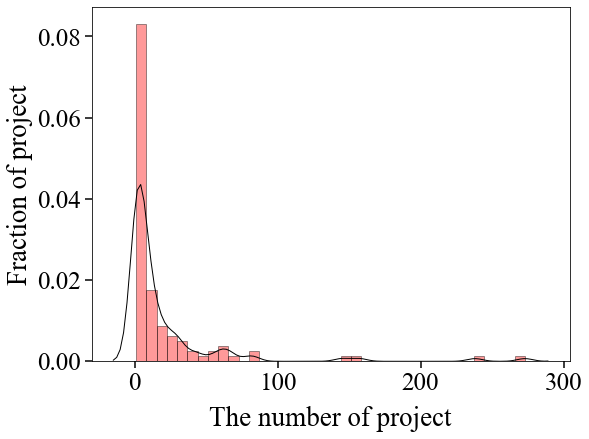

In [15]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111)
sns.distplot(project_with_foreign_country.groupby('country').size(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='red'), 
             ax=ax)

ax.set_xlabel("The number of project", fontsize=27, fontname='times new roman', labelpad=10)
ax.set_ylabel("Fraction of project", fontsize=27, fontname='times new roman', labelpad=4)
ax.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]
plt.subplots_adjust(left=0.14, right=0.97, top=0.98, bottom=0.15)

plt.subplots_adjust(left=0.15, right=0.98, top=0.98, bottom=0.16)
#plt.savefig(r"C:\PPP\Thesis\Paper2\fractionofprojects.png", dpi=1000)

In [25]:
project_with_foreign_country.groupby('country').size().skew()

4.217991869690868

In [20]:
project_with_foreign_country.groupby('country').size().sort_values()

country
Afghanistan             1
West Bank and Gaza      1
Tonga                   1
Somalia                 1
Paraguay                1
                     ... 
Peru                   83
India                 144
Mexico                155
China                 237
Brazil                273
Length: 111, dtype: int64

In [21]:
data_for_network.shape

(4932, 10)

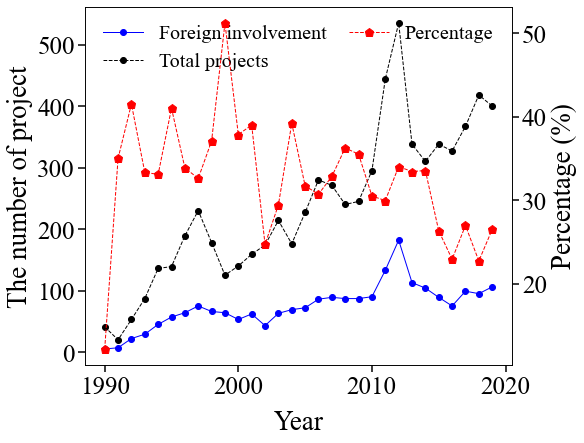

In [67]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111)
ax.plot(project_with_foreign_country.groupby('IY').size(), c='blue', marker='.', linewidth=1, markersize=12, label='Foreign involvement')
ax.plot(data.groupby('IY').size(), c='black', marker='.', linestyle='--', linewidth=1, markersize=12, label='Total projects')

ax.set_xlabel("Year", fontsize=27, fontname='times new roman', labelpad=10)
ax.set_ylabel("The number of project", fontsize=27, fontname='times new roman', labelpad=4)
ax.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]
ax.legend(loc=2, frameon=False, prop={'family':'Times new roman', 'size':20})


ax2 = ax.twinx()
ax2.plot(project_with_foreign_country.groupby('IY').size()/data.groupby('IY').size()*100, 
         c='red', marker='p', linestyle='--', linewidth=1, markersize=9, label='Percentage')
ax2.set_ylabel("Percentage (%)", fontsize=27, fontname='times new roman', labelpad=4)
ax2.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax2.get_xticklabels() + ax2.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]
ax2.legend(loc=0, frameon=False, prop={'family':'Times new roman', 'size':20})

plt.subplots_adjust(left=0.14, right=0.88, top=0.98, bottom=0.15)
plt.savefig(r"C:\PPP\Thesis\Paper2\numberofprojectswithforeigncountry.png", dpi=1000)
plt.show()

In [22]:
project_with_foreign_country.groupby('IY').size()/data.groupby('IY').size()

IY
1990    0.121951
1991    0.350000
1992    0.396226
1993    0.310345
1994    0.330882
1995    0.395683
1996    0.333333
1997    0.321739
1998    0.370787
1999    0.504000
2000    0.378571
2001    0.389937
2002    0.235632
2003    0.294393
2004    0.386364
2005    0.317181
2006    0.307143
2007    0.328413
2008    0.362500
2009    0.355102
2010    0.301695
2011    0.299550
2012    0.340187
2013    0.331361
2014    0.332258
2015    0.248521
2016    0.226300
2017    0.267030
2018    0.222488
2019    0.265000
dtype: float64

In [70]:
data.groupby('country').size().sort_values()

country
Lesotho          1
Guyana, CR       1
Fiji             1
Maldives         1
Mauritania       1
              ... 
Argentina      207
Mexico         328
Brazil         964
India         1041
China         1723
Length: 121, dtype: int64

IY
1990     25
1991     16
1992     42
1993     60
1994     93
1995     92
1996    126
1997    155
1998    127
1999     89
2000     93
2001    114
2002     97
2003    159
2004    162
2005    208
2006    227
2007    228
2008    181
2009    178
2010    161
2011    258
2012    361
2013    269
2014    213
2015    231
2016    194
2017    244
2018    241
2019    288
dtype: int64

In [28]:
dataframe = data_for_network.copy()
for year in np.arange(1990, 1995):
    dataframe.loc[dataframe[dataframe['IY']==year].index, 'IY'] = '1990-1994'
for year in np.arange(1995, 2000):
    dataframe.loc[dataframe[dataframe['IY']==year].index, 'IY'] = '1995-1999'
for year in np.arange(2000, 2005):
    dataframe.loc[dataframe[dataframe['IY']==year].index, 'IY'] = '2000-2004'
for year in np.arange(2005, 2010):
    dataframe.loc[dataframe[dataframe['IY']==year].index, 'IY'] = '2005-2009'
for year in np.arange(2010, 2015):
    dataframe.loc[dataframe[dataframe['IY']==year].index, 'IY'] = '2010-2014'
for year in np.arange(2015, 2020):
    dataframe.loc[dataframe[dataframe['IY']==year].index, 'IY'] = '2015-2019'

In [125]:
all_network = data_for_network.copy()
all_network.IY = '1'

In [126]:
all_network

,IY,country,Region,sector,ssector,PCO,government_involve,foreign_country,sponsor_number,foreign_fund
0,1,Argentina,LAC,Transport,Toll Roads,N/N/6,N,N,6,NaN
2,1,Thailand,EAP,Transport,Seaports,N/N/4,N,N,4,NaN
3,1,Thailand,EAP,ICT,Telecom,N/N/1,N,N,1,NaN
4,1,Mexico,LAC,Transport,Toll Roads,N/N/3/Local Bank,N,N,3,Local Bank
5,1,Mexico,LAC,Transport,Toll Roads,N/N/7,N,N,7,NaN
...,...,...,...,...,...,...,...,...,...,...
7091,1,China,EAP,Water and sewerage,Treatment plant,Y/N/3,Y,N,3,NaN
7092,1,China,EAP,Water and sewerage,Treatment plant,N/N/1,N,N,1,NaN
7093,1,Turkey,ECA,Energy,Electricity,N/N/1,N,N,1,NaN
7094,1,Turkey,ECA,Energy,Electricity,N/N/1,N,N,1,NaN


In [184]:
all_network[(all_network.IY == '1') & (all_network.sector == 'Transport')]

,IY,country,Region,sector,ssector,PCO,government_involve,foreign_country,sponsor_number,foreign_fund
0,1,Argentina,LAC,Transport,Toll Roads,N/N/6,N,N,6,NaN
2,1,Thailand,EAP,Transport,Seaports,N/N/4,N,N,4,NaN
4,1,Mexico,LAC,Transport,Toll Roads,N/N/3/Local Bank,N,N,3,Local Bank
5,1,Mexico,LAC,Transport,Toll Roads,N/N/7,N,N,7,NaN
6,1,Mexico,LAC,Transport,Toll Roads,N/N/2,N,N,2,NaN
...,...,...,...,...,...,...,...,...,...,...
7061,1,China,EAP,Transport,Toll Roads,Y/N/3,Y,N,3,NaN
7063,1,China,EAP,Transport,Toll Roads,Y/N/3,Y,N,3,NaN
7065,1,China,EAP,Transport,Toll Roads,N/N/1,N,N,1,NaN
7080,1,China,EAP,Transport,Toll Roads,Y/N/2,Y,N,2,NaN


In [66]:
data_for_network_copy = data_for_network[data_for_network.sector=='Water and sewerage']

In [67]:
data_for_network_copy

,IY,country,Region,sector,ssector,PCO,government_involve,foreign_country,sponsor_number,foreign_fund
17,1991,Argentina,LAC,Water and sewerage,Water Utility,N/UK/2/Local Bank,N,UK,2,Local Bank
33,1992,South Africa,AFR,Water and sewerage,Water Utility,N/France/1,N,France,1,NaN
34,1992,Malaysia,EAP,Water and sewerage,Treatment plant,N/France/3/Malaysia,N,France,3,Malaysia
36,1992,Argentina,LAC,Water and sewerage,Water Utility,N/N/1,N,N,1,NaN
66,1993,Malaysia,EAP,Water and sewerage,Treatment plant,N/UK/1,N,UK,1,NaN
...,...,...,...,...,...,...,...,...,...,...
7066,2019,China,EAP,Water and sewerage,Treatment plant,N/N/2,N,N,2,NaN
7069,2019,China,EAP,Water and sewerage,Treatment plant,N/N/1,N,N,1,NaN
7083,2019,China,EAP,Water and sewerage,Treatment plant,Y/N/5,Y,N,5,NaN
7091,2019,China,EAP,Water and sewerage,Treatment plant,Y/N/3,Y,N,3,NaN


In [23]:
!pip install neo4j

In [ ]:
#Functions to build the network
from neo4j import GraphDatabase
                            
def create_node(tx, identity, country):
    result = tx.run("Merge (:" + identity + " {name:$name})", name=country)
    
#delete node with no links
def delete_node(tx):
    result = tx.run("Match (a) "
                    "where size((a)--())=0 "
                    "delete a")
      
def create_relation(tx, relation, number, country1, country2):
    result = tx.run("Match (a:Country {name:$country1}), (b:Country {name:$country2})"
                    "Merge (a)-[:" + relation + " {number:$number}]->(b)",
                    country1=country1, number=number,country2=country2)

def find_relation(tx, relation, country1, country2):
    search_result = 0
    result = tx.run("Match (a:Country {name:$country1})-[r:" + relation + "]->(b:Country {name:$country2})"
                    "Return r.number as Number", 
                    country1=country1, country2=country2)
    for num in result:
        search_result = num['Number']
    return search_result

    
def update_relation(tx, relation, number, country1, country2):
    result = tx.run("Match (:Country {name: $country1})-[r:" + relation + "]->(:Country {name:$country2}) " 
                    "Set r.number = $number", 
                    country1=country1, country2=country2, number=number)

#preparing for data.  
years = np.sort(data_for_network_copy.IY.unique())
#years = ['1990-1994', '1995-1999', '2000-2004', '2005-2009', '2010-2014', '2015-2019']
#years = ['1']

driver = GraphDatabase.driver("bolt://localhost:7687", auth=("neo4j", "SPV"))
query_delete_nodes = "Match (n) detach delete n"
all_out_degree = []
all_network_size = []
all_average_degree = []
all_in_degree = []
all_unweighted_density = []
all_weighted_density = []
all_diameter = []
all_pagerank = []
all_weight_country = []

for year in years:
    non_fund_flow = data_for_network_copy[data_for_network_copy.IY == year]
    #non_fund_flow = dataframe[dataframe.IY == year]
    #non_fund_flow = all_network[(all_network.IY == year)]
    countries = non_fund_flow.country.unique() 

    with driver.session() as session:
       #clear model first
        session.run(query_delete_nodes)
        for country in countries:
            session.write_transaction(create_node, "Country", country)
          
        for i in non_fund_flow.index:
            country_list = non_fund_flow.loc[i, 'foreign_country'].split(',')
            for country in country_list:
                if country != 'N':
                    country = country.lstrip()
                    country = country.rstrip()
                
                    if not '(' in country:
                        countryNode = country
                        relationship = 'JOIN'
                    else:
                        countryNode = country.split('(')[0]                        
                        #relationship = country.split('(')[1].replace(')', '')
                        relationship = 'JOIN'
                
                    session.write_transaction(create_node, "Country", countryNode)                 
                    tt = session.read_transaction(find_relation, relationship, 
                                                  countryNode, non_fund_flow.loc[i, 'country'])
                    if tt == 0:
                        session.write_transaction(create_relation, relationship, 1, 
                                                  countryNode, non_fund_flow.loc[i, 'country'])
                    else:  
                        session.write_transaction(update_relation, relationship, tt + 1, 
                                                  countryNode, non_fund_flow.loc[i, 'country'])
        session.write_transaction(delete_node)
    #calculate the outdegree.                   
        query_out_degree = '''CALL gds.alpha.degree.write({
        nodeProjection: 'Country',
        relationshipProjection: { 
           JOIN: {
                   type: 'JOIN',
                   properties: 'number'                                                 
            }                                                                            
        },
        relationshipWeightProperty: 'number',
        writeProperty: 'outdegree'
        })'''
        session.run(query_out_degree)
    #calculate the indegree
        query_in_degree = '''CALL gds.alpha.degree.write({
        nodeProjection: 'Country',
        relationshipProjection: { 
           JOIN: {
                   type: 'JOIN',
                   orientation: 'Reverse',
                   properties: 'number'                                                 
            }                                                                            
        },
        relationshipWeightProperty: 'number',
        writeProperty: 'indegree'
        })'''
        session.run(query_in_degree)
    #calculate the pagerank
        query_pagerank = '''CALL gds.pageRank.write({
        nodeProjection: 'Country',
        relationshipProjection: {
           JOIN: {
                   type:'JOIN',
                   properties: 'number'           
           }
        },
        maxIterations: 20,
        dampingFactor: 0.85,
        writeProperty: 'pagerank'
        })'''
        session.run(query_pagerank)
    #1.get the number of the nodes in the current network
        query_node_size = '''
        Match (n)
        Return count(n) as networksize'''
        
        network_size = pd.DataFrame([dict(_) for _ in session.run(query_node_size)])
        all_network_size.append(network_size)
    #2.get the average degree
        query_average_degree = '''
        Match(n)
        With count(n) as nodesize, sum(size((n)-[]->())) as relationsize
        Return toFloat(relationsize)/nodesize as averagedegree'''
        
        average_degree = pd.DataFrame([dict(_) for _ in session.run(query_average_degree)])
        all_average_degree.append(average_degree)
        
    #3.get the unweighted density
        query_unweighted_density = '''
        Match(n)
        With count(n) as nodesize, sum(size((n)-[]->())) as relationsize
        Return toFloat(relationsize)/(nodesize * (nodesize-1.0)) as unweighteddensity'''
        
        unweighted_density = pd.DataFrame([dict(_) for _ in session.run(query_unweighted_density)])
        all_unweighted_density.append(unweighted_density)
    #4.get the weighted density
        query_weighted_density = '''
        Match (n)-[r]->()
        With sum(r.number) as relationsize
        Match (m)
        Return toFloat(relationsize)/(count(m) * (count(m)-1.0)) as weighteddensity'''
        
        weighted_density = pd.DataFrame([dict(_) for _ in session.run(query_weighted_density)])
        all_weighted_density.append(weighted_density)
    #5.get the diameter
        query_diameter = '''
        MATCH (a:Country), (b:Country) WHERE id(a) > id(b)
        MATCH path = shortestPath((a)-[:JOIN*]-(b))

        RETURN length(path) AS diameter
        ORDER BY diameter DESC
        LIMIT 1'''
        
        diameter = pd.DataFrame([dict(_) for _ in session.run(query_diameter)])
        all_diameter.append(diameter)
    
    #6.outdegree
        outdegree_query_result = '''
        Match(n:Country)
        Return n.name, n.outdegree as year'''
    
        out_degree = pd.DataFrame([dict(_) for _ in session.run(outdegree_query_result)])
        all_out_degree.append(out_degree)
    #7.indegree
        indegree_query_result = '''
        Match(n:Country)
        Return n.name, n.indegree as year'''
        
        in_degree = pd.DataFrame([dict(_) for _ in session.run(indegree_query_result)])
        all_in_degree.append(in_degree)
    #8.pagerank
        pagerank_query_result = '''
        Match(n:Country)
        Return n.name, n.pagerank as year'''
        
        pagerank = pd.DataFrame([dict(_) for _ in session.run(pagerank_query_result)])
        all_pagerank.append(pagerank)
    #9.country and corresponding node
        countryweight_query_result = '''
        Match (n)-[r]->(m)
        Return n.name as outcountry, r.number as weight, m.name as incountry'''
        
        countryandrelation = pd.DataFrame([dict(_) for _ in session.run(countryweight_query_result)])
        all_weight_country.append(countryandrelation)

        session.run(query_delete_nodes)
                                   
    driver.close()
    print("Year %s has been calculated..." % year)
    print("The length of the list is %s" % len(all_weight_country))

Year 1991 has been calculated...
The length of the list is 1
Year 1992 has been calculated...
The length of the list is 2
Year 1993 has been calculated...
The length of the list is 3
Year 1994 has been calculated...
The length of the list is 4
Year 1995 has been calculated...
The length of the list is 5
Year 1996 has been calculated...
The length of the list is 6
Year 1997 has been calculated...
The length of the list is 7
Year 1998 has been calculated...
The length of the list is 8
Year 1999 has been calculated...
The length of the list is 9
Year 2000 has been calculated...
The length of the list is 10
Year 2001 has been calculated...
The length of the list is 11


In [31]:
#network size 
network_size_result = []
for network in all_network_size:
    network_size_result.append(network['networksize'].iloc[0])

In [32]:
#average degree
average_degree_result = []
for network in all_average_degree:
    average_degree_result.append(network['averagedegree'].iloc[0])

In [33]:
#unweighted density
unweighted_density_result = []
for network in all_unweighted_density:
    unweighted_density_result.append(network['unweighteddensity'].iloc[0])

In [34]:
#weighted density
weighted_density_result = []
for network in all_weighted_density:
    weighted_density_result.append(network['weighteddensity'].iloc[0])

In [35]:
#diameter
diameter_result = []
for network in all_diameter:
    diameter_result.append(network['diameter'].iloc[0])

In [49]:
#out_degree
outdegree_merged_data = all_out_degree[0]
for data in all_out_degree[1:]:
    outdegree_merged_data = outdegree_merged_data.merge(data, how='outer', left_on='n.name', right_on='n.name')

outdegree_merged_data.set_index('n.name', inplace=True)
outdegree_merged_data.index.name = 'country'
outdegree_merged_data.columns = years

In [50]:
outdegree_merged_data

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
country,,,,,,,,,,,,,,,,,,,,,
Côte d'Ivoire,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
France,1.0,1.0,3.0,1.0,7.0,6.0,4.0,4.0,4.0,3.0,...,2.0,8.0,7.0,5.0,4.0,4.0,3.0,7.0,6.0,11.0
Philippines,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,...,0.0,NaN,1.0,0.0,NaN,0.0,NaN,NaN,2.0,1.0
Guinea-Bissau,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK,NaN,1.0,1.0,1.0,4.0,2.0,5.0,6.0,4.0,3.0,...,6.0,5.0,6.0,5.0,2.0,11.0,1.0,4.0,5.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zimbabwe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
United Arab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,2.0
Sierra Leone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


In [51]:
outdegree_merged_data.to_csv(r"C:\Users\Meghdad\Desktop\dd\Energyoutdegree.csv")

In [52]:
#in_degree
indegree_merged_data = all_in_degree[0]
for data in all_in_degree[1:]:
    indegree_merged_data = indegree_merged_data.merge(data, how='outer', left_on='n.name', right_on='n.name')

indegree_merged_data.set_index('n.name', inplace=True)
indegree_merged_data.index.name = 'country'
indegree_merged_data.columns = years

In [53]:
indegree_merged_data

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
country,,,,,,,,,,,,,,,,,,,,,
Côte d'Ivoire,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
France,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Philippines,NaN,1.0,NaN,5.0,5.0,6.0,3.0,3.0,1.0,NaN,...,3.0,NaN,6.0,1.0,NaN,10.0,NaN,NaN,0.0,0.0
Guinea-Bissau,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UK,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zimbabwe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
United Arab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0
Sierra Leone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN


In [54]:
indegree_merged_data.to_csv(r"C:\Users\Meghdad\Desktop\dd\Energyindegree.csv")

In [55]:
#pagerank
pagerank_merged_data = all_pagerank[0]
for data in all_pagerank[1:]:
    pagerank_merged_data = pagerank_merged_data.merge(data, how='outer', left_on='n.name', right_on='n.name')

pagerank_merged_data.set_index('n.name', inplace=True)
pagerank_merged_data.index.name = 'country'
pagerank_merged_data.columns = years

In [56]:
pagerank_merged_data.to_csv(r"C:\Users\Meghdad\Desktop\dd\Energypagerank.csv")

In [141]:
in_out_degree = indegree_merged_data.merge(outdegree_merged_data, left_on='country', right_on='country')
in_out_degree = in_out_degree[(in_out_degree['1_x']!=0) & (in_out_degree['1_y']!=0)]
in_out_degree = in_out_degree.reset_index()

In [155]:
in_out_degree.country = in_out_degree.country.map(lambda x: country_code[x])

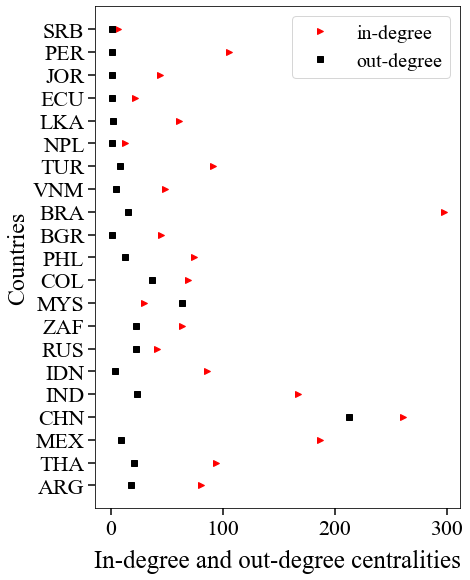

In [187]:
fig = plt.figure(figsize=(6.5, 8.5))
ax = fig.add_subplot(111)
ax.plot( in_out_degree['1_x'],in_out_degree.country, '>', color='red', label='in-degree')
ax.plot( in_out_degree['1_y'],in_out_degree.country, 's',color='black', label='out-degree')

ax.set_xlabel("In-degree and out-degree centralities", fontsize=25, fontname='times new roman', labelpad=10)
ax.set_ylabel("Countries", fontsize=24, fontname='times new roman', labelpad=4)
ax.tick_params(axis='both', length=7, labelsize=22, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]
ax.legend(loc=1, frameon=True, prop={'family':'Times new roman', 'size':20})
plt.subplots_adjust(left=0.2, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\in-out-degree.png", dpi=1000)

In [145]:
code

,country,countrycode
0,Argentina,ARG
1,Mexico,MEX
2,Thailand,THA
3,Thailand,THA
4,Mexico,MEX
...,...,...
7091,China,CHN
7092,China,CHN
7093,Turkey,TUR
7094,Turkey,TUR


In [39]:
#all network for 30 years
all_network_30years = all_weight_country.copy()

In [40]:
for singlelist in all_network_30years:
    single_network = singlelist.copy()
    print(single_network[single_network['weight'] > 3].incountry.nunique())

3
11
8
8
20
15


In [41]:
for singlelist in all_network_30years:
    single_network = singlelist.copy()
    print(single_network[single_network['weight'] > 3].outcountry.nunique())

3
8
10
11
15
13


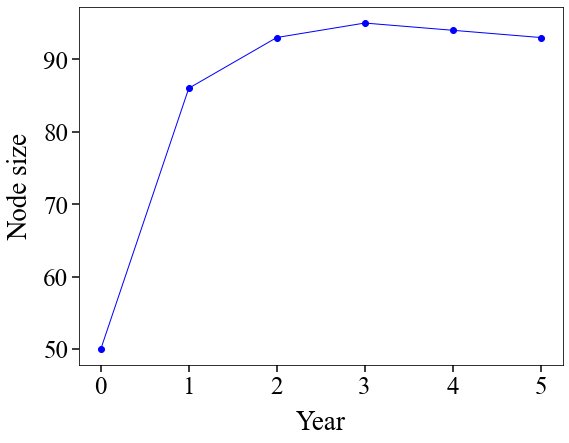

In [69]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111)
#ax.plot(np.arange(1990, 2020), network_size_result, c='blue', marker='.', linewidth=1, markersize=12)
ax.plot(network_size_result, c='blue', marker='.', linewidth=1, markersize=12)
ax.set_xlabel("Year", fontsize=27, fontname='times new roman', labelpad=10)
ax.set_ylabel("Node size", fontsize=27, fontname='times new roman', labelpad=10)
ax.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]
plt.subplots_adjust(left=0.13, right=0.97, top=0.98, bottom=0.15)
#plt.savefig(r"C:\PPP\Thesis\Paper2\network size.png", dpi=1000)
plt.show()

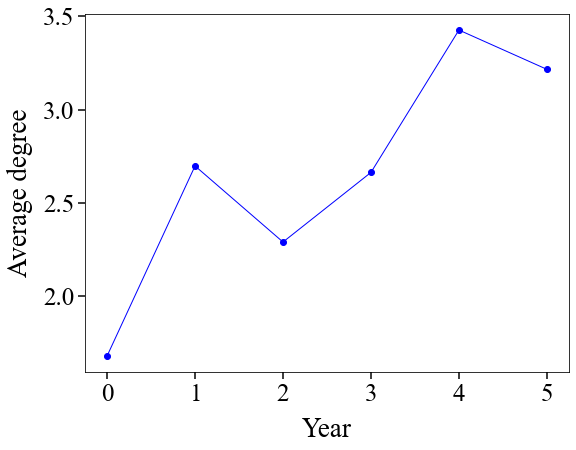

In [18]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111)
#ax.plot(np.arange(1990, 2020), average_degree_result, c='blue', marker='.', linewidth=1, markersize=12)
ax.plot(average_degree_result, c='blue', marker='.', linewidth=1, markersize=12)
ax.set_xlabel("Year", fontsize=27, fontname='times new roman', labelpad=10)
ax.set_ylabel("Average degree", fontsize=27, fontname='times new roman', labelpad=10)
ax.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]
plt.subplots_adjust(left=0.13, right=0.97, top=0.98, bottom=0.15)
#plt.savefig(r"C:\PPP\Thesis\Paper2\average degree.png", dpi=1000)
plt.show()

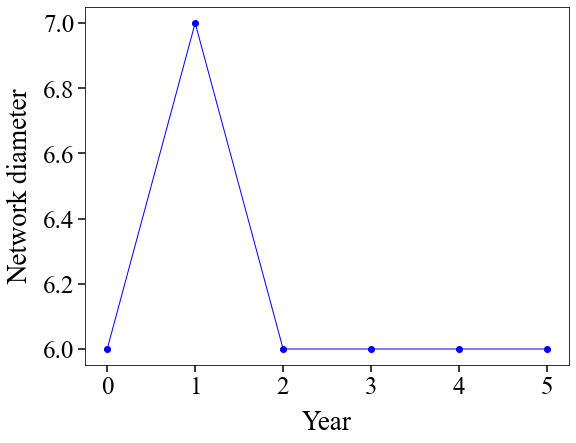

In [19]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111)
#ax.plot(np.arange(1990, 2020), diameter_result, c='blue', marker='.', linewidth=1, markersize=12)
ax.plot(diameter_result, c='blue', marker='.', linewidth=1, markersize=12)
ax.set_xlabel("Year", fontsize=27, fontname='times new roman', labelpad=10)
ax.set_ylabel("Network diameter", fontsize=27, fontname='times new roman', labelpad=10)
ax.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]
plt.subplots_adjust(left=0.13, right=0.97, top=0.98, bottom=0.15)
#plt.savefig(r"C:\PPP\Thesis\Paper2\diameter.png", dpi=1000)
plt.show()

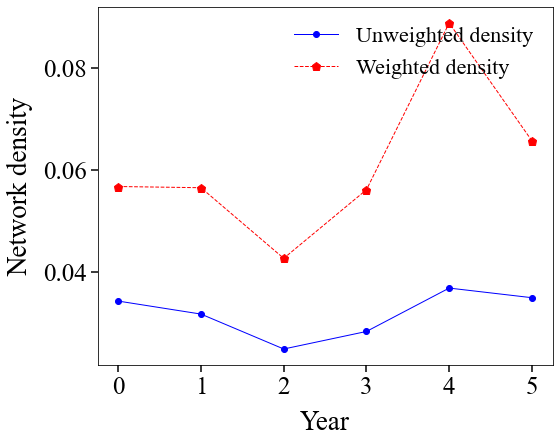

In [20]:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111)
#ax.plot(np.arange(1990, 2020), unweighted_density_result, c='blue', marker='.', linewidth=1, markersize=12, label='Unweighted density')
#ax.plot(np.arange(1990, 2020), weighted_density_result, c='red', marker='p', linestyle='--', linewidth=1, markersize=9, label='Weighted density')
ax.plot(unweighted_density_result, c='blue', marker='.', linewidth=1, markersize=12, label='Unweighted density')
ax.plot(weighted_density_result, c='red', marker='p', linestyle='--', linewidth=1, markersize=9, label='Weighted density')
ax.set_xlabel("Year", fontsize=27, fontname='times new roman', labelpad=10)
ax.set_ylabel("Network density", fontsize=27, fontname='times new roman', labelpad=10)
ax.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]

ax.legend(loc=1, frameon=False, prop={'family':'Times new roman', 'size':22})

plt.subplots_adjust(left=0.18, right=0.97, top=0.98, bottom=0.15)
#plt.savefig(r"C:\PPP\Thesis\Paper2\density.png", dpi=1000)
plt.show()

In [42]:
#Top 5 countries in-degree and out-degree
columns = indegree_merged_data.columns
result = {}
for column in columns:
    new_series = indegree_merged_data[column].copy()
    new_series.sort_values(ascending=False, inplace=True)    
    result[column] = new_series.index[:3].values
in_df_result = pd.DataFrame(result)
for column in columns:
    in_df_result[column] = in_df_result[column].map(lambda x: country_code.loc[x, 'countrycode'])

In [43]:
in_df_result

,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
0,ARG,CHN,CHN,CHN,BRA,BRA
1,CHN,BRA,BRA,BRA,IND,MEX
2,MYS,IDN,IND,IND,MEX,PER


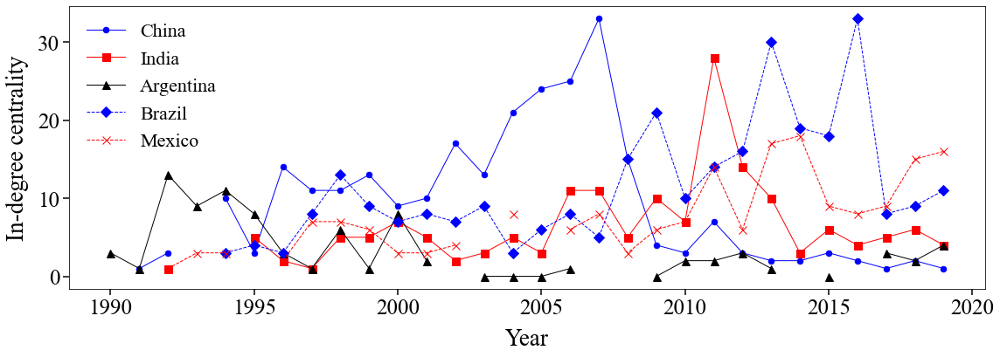

In [327]:
fig = plt.figure(figsize=(16, 5.5))
ax = fig.add_subplot(111)
ax.plot(np.arange(1990, 2020), indegree_merged_data.T.China, c='blue', marker='.', linewidth=1, markersize=13, label='China')
ax.plot(np.arange(1990, 2020), indegree_merged_data.T.India, c='red', marker='s', linewidth=1, markersize=9, label='India')
ax.plot(np.arange(1990, 2020), indegree_merged_data.T.Argentina, c='black', marker='^', linewidth=1, markersize=9, label='Argentina')
ax.plot(np.arange(1990, 2020), indegree_merged_data.T.Brazil, c='blue', marker='D', linewidth=1, linestyle='--', markersize=9, label='Brazil')
ax.plot(np.arange(1990, 2020), indegree_merged_data.T.Mexico, c='red', marker='x', linewidth=1, linestyle='--', markersize=9, label='Mexico')

ax.set_xlabel("Year", fontsize=27, fontname='times new roman', labelpad=10)
ax.set_ylabel("In-degree centrality", fontsize=27, fontname='times new roman', labelpad=10)
ax.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]

ax.legend(loc=2, frameon=False, prop={'family':'Times new roman', 'size':22})

plt.subplots_adjust(left=0.07, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\countryindegree.png", dpi=1000)

In [260]:
#Top 5 countries out-degree and out-degree
columns = outdegree_merged_data.columns
result = {}
for column in columns:
    new_series = outdegree_merged_data[column].copy()
    new_series.sort_values(ascending=False, inplace=True)    
    result[column] = new_series.index[:3].values
out_df_result = pd.DataFrame(result)
for column in columns:
    out_df_result[column] = out_df_result[column].map(lambda x: country_code.loc[x, 'countrycode'])
out_df_result.to_csv(r"C:\PPP\Thesis\Paper2\top3outdegree.csv")

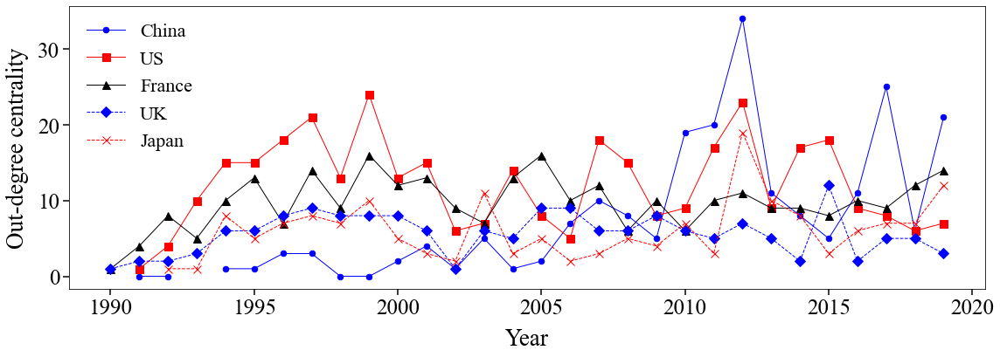

In [323]:
fig = plt.figure(figsize=(16, 5.5))
ax = fig.add_subplot(111)
ax.plot(np.arange(1990, 2020), outdegree_merged_data.T.China, c='blue', marker='.', linewidth=1, markersize=13, label='China')
ax.plot(np.arange(1990, 2020), outdegree_merged_data.T.US, c='red', marker='s', linewidth=1, markersize=9, label='US')
ax.plot(np.arange(1990, 2020), outdegree_merged_data.T.France, c='black', marker='^', linewidth=1, markersize=9, label='France')
ax.plot(np.arange(1990, 2020), outdegree_merged_data.T.UK, c='blue', marker='D', linewidth=1, linestyle='--', markersize=9, label='UK')
ax.plot(np.arange(1990, 2020), outdegree_merged_data.T.Japan, c='red', marker='x', linewidth=1, linestyle='--', markersize=9, label='Japan')

ax.set_xlabel("Year", fontsize=27, fontname='times new roman', labelpad=10)
ax.set_ylabel("Out-degree centrality", fontsize=27, fontname='times new roman', labelpad=10)
ax.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]

ax.legend(loc=2, frameon=False, prop={'family':'Times new roman', 'size':22})

plt.subplots_adjust(left=0.07, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\countryoutdegree.png", dpi=1000)

In [261]:
out_df_result

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,ES,FR,FR,US,US,US,US,US,US,US,...,CHN,ES,DE,ES,ES,ES,IT,CHN,IT,CHN
1,GB,GB,ES,FR,FR,FR,GB,FR,FR,FR,...,ES,CHN,CHN,DE,US,US,CHN,ES,FR,ES
2,FR,US,US,SG,JP,IFC,SG,GB,GB,JP,...,DE,US,US,CHN,FR,GB,ES,IT,ES,FR


In [265]:
columns = pagerank_merged_data.columns
result = {}
for column in columns:
    new_series = pagerank_merged_data[column].copy()
    new_series.sort_values(ascending=False, inplace=True)    
    result[column] = new_series.index[:3].values
pagerank_df_result = pd.DataFrame(result)
for column in columns:
    pagerank_df_result[column] = pagerank_df_result[column].map(lambda x: country_code.loc[x, 'countrycode'])
pagerank_df_result.to_csv(r"C:\PPP\Thesis\Paper2\top3pagerank.csv")

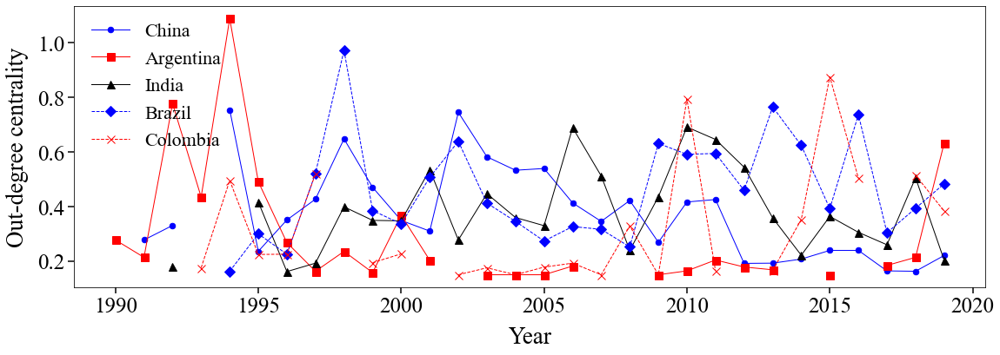

In [330]:
fig = plt.figure(figsize=(16, 5.5))
ax = fig.add_subplot(111)
ax.plot(np.arange(1990, 2020), pagerank_merged_data.T.China, c='blue', marker='.', linewidth=1, markersize=13, label='China')
ax.plot(np.arange(1990, 2020), pagerank_merged_data.T.Argentina, c='red', marker='s', linewidth=1, markersize=9, label='Argentina')
ax.plot(np.arange(1990, 2020), pagerank_merged_data.T.India, c='black', marker='^', linewidth=1, markersize=9, label='India')
ax.plot(np.arange(1990, 2020), pagerank_merged_data.T.Brazil, c='blue', marker='D', linewidth=1, linestyle='--', markersize=9, label='Brazil')
ax.plot(np.arange(1990, 2020), pagerank_merged_data.T.Colombia, c='red', marker='x', linewidth=1, linestyle='--', markersize=9, label='Colombia')

ax.set_xlabel("Year", fontsize=27, fontname='times new roman', labelpad=10)
ax.set_ylabel("Out-degree centrality", fontsize=27, fontname='times new roman', labelpad=10)
ax.tick_params(axis='both', length=7, labelsize=25, width=1.5, color='black')
labels = ax.get_xticklabels() + ax.get_yticklabels()
[label.set_fontname('Times New Roman') for label in labels]

ax.legend(loc=2, frameon=False, prop={'family':'Times new roman', 'size':22})

plt.subplots_adjust(left=0.07, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\pagerankcountry.png", dpi=1000)

In [263]:
pagerank_df_result

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,YEM,CHN,ARG,ARG,ARG,PHL,IDN,BRA,BRA,CHN,...,RUS,BWA,PER,PER,PER,PER,BRA,EGY,VNM,ARG
1,CIV,PHL,THA,MYS,PHL,ARG,LAO,COL,CHN,THA,...,COL,IND,LAO,BRA,SRB,COL,ECU,PER,COL,BRA
2,ARG,ARG,CHN,PHL,CHN,KHM,CHN,MMR,SLV,BRA,...,IND,TUR,ZAF,GTM,BRA,PHL,COL,IRN,IND,CUB


In [264]:
pagerank_merged_data

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
country,,,,,,,,,,,,,,,,,,,,,
Argentina,0.2775,0.21375,0.776875,0.43475,1.088704,0.490966,0.267841,0.16275,0.235506,0.157969,...,0.164167,0.204091,0.178397,0.168181,NaN,0.15,NaN,0.184152,0.213750,0.631651
Côte d'Ivoire,0.2775,NaN,NaN,NaN,0.218000,0.204091,NaN,NaN,NaN,0.160625,...,0.175500,NaN,NaN,NaN,NaN,NaN,NaN,0.164167,NaN,0.224375
"Yemen, Rep.",0.2775,NaN,NaN,NaN,NaN,NaN,NaN,0.19250,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.1755,NaN,NaN,NaN
Spain,0.1500,NaN,0.150000,0.15000,0.150000,0.150000,0.150000,0.15000,0.150000,0.150000,...,0.150000,0.150000,0.150000,0.150000,0.15,0.15,0.1500,0.150000,0.150000,0.150000
France,0.1500,0.15000,0.150000,0.15000,0.150000,0.150000,0.150000,0.15000,0.150000,0.150000,...,0.150000,0.150000,0.150000,0.150000,0.15,0.15,0.1500,0.150000,0.150000,0.150000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zimbabwe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.159967,NaN,NaN
Montenegro,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.173056,NaN
Somalia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.213750,NaN


In [44]:
new_indegree_merged_data = indegree_merged_data.copy()
new_outdegree_merged_data = outdegree_merged_data.copy()
new_pagerank_merged_data = pagerank_merged_data.copy()
new_all_weight_country = all_weight_country.copy()

In [45]:
new_all_weight_country[0]

,outcountry,weight,incountry
0,Japan,2,Argentina
1,Italy,1,Argentina
2,Philippines,1,Argentina
3,Chile,1,Argentina
4,Belgium,1,Argentina
...,...,...,...
74,France,1,Madagascar
75,France,1,Guinea-Bissau
76,UK,1,"Egypt, Arab Rep."
77,France,1,São Tomé and Principe


In [46]:
new_all_weight_country[0]

,outcountry,weight,incountry
0,Japan,2,Argentina
1,Italy,1,Argentina
2,Philippines,1,Argentina
3,Chile,1,Argentina
4,Belgium,1,Argentina
...,...,...,...
74,France,1,Madagascar
75,France,1,Guinea-Bissau
76,UK,1,"Egypt, Arab Rep."
77,France,1,São Tomé and Principe


In [47]:
import networkx as nx

In [48]:
new_indegree_merged_data = new_indegree_merged_data.merge(country_code, how='left', left_on='country', right_on='country')
new_indegree_merged_data.set_index('countrycode', drop=True, inplace=True)

In [49]:
new_outdegree_merged_data = new_outdegree_merged_data.merge(country_code, how='left', left_on='country', right_on='country')
new_outdegree_merged_data.set_index('countrycode', drop=True, inplace=True)

In [50]:
new_outdegree_merged_data

,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
countrycode,,,,,,
ARG,0.0,2.0,4.0,3.0,4.0,5.0
THA,0.0,5.0,1.0,1.0,6.0,8.0
MEX,1.0,2.0,0.0,0.0,2.0,4.0
CHN,1.0,7.0,13.0,32.0,92.0,68.0
IND,0.0,1.0,7.0,5.0,10.0,1.0
...,...,...,...,...,...,...
ZWE,NaN,NaN,NaN,NaN,NaN,0.0
SOM,NaN,NaN,NaN,NaN,NaN,0.0
PRY,NaN,NaN,NaN,NaN,NaN,0.0


In [51]:
new_pagerank_merged_data = new_pagerank_merged_data.merge(country_code, how='left', left_on='country', right_on='country')
new_pagerank_merged_data.set_index('countrycode', drop=True, inplace=True)

In [52]:
new_pagerank_merged_data

,1990-1994,1995-1999,2000-2004,2005-2009,2010-2014,2015-2019
countrycode,,,,,,
ARG,1.328255,0.235847,0.223380,0.155543,0.184459,0.394264
THA,0.520357,0.464224,0.246610,0.217330,0.227494,0.246333
MEX,0.287573,0.272273,0.212572,0.472836,0.424052,0.610189
CHN,0.668351,0.410464,0.594721,0.302312,0.259604,0.368417
IND,0.160625,0.395237,0.541681,0.399507,0.497886,0.279346
...,...,...,...,...,...,...
ZWE,NaN,NaN,NaN,NaN,NaN,0.160102
SOM,NaN,NaN,NaN,NaN,NaN,0.171250
PRY,NaN,NaN,NaN,NaN,NaN,0.158500


In [53]:
listkey = list(country_code.index.values)
listvalue = list(country_code.countrycode.values)
country_code = {k: v for k, v in zip(listkey, listvalue)}

In [54]:
tt = new_all_weight_country.copy()

In [55]:
tt[0]

,outcountry,weight,incountry
0,Japan,2,Argentina
1,Italy,1,Argentina
2,Philippines,1,Argentina
3,Chile,1,Argentina
4,Belgium,1,Argentina
...,...,...,...
74,France,1,Madagascar
75,France,1,Guinea-Bissau
76,UK,1,"Egypt, Arab Rep."
77,France,1,São Tomé and Principe


In [56]:
#change the country in all_weight_country with country code
for i in np.arange(len(new_all_weight_country)):
    new_all_weight_country[i].outcountry = new_all_weight_country[i].outcountry.map(country_code)
    new_all_weight_country[i].incountry = new_all_weight_country[i].incountry.map(country_code) 

In [57]:
new_all_weight_country[0]

,outcountry,weight,incountry
0,JP,2,ARG
1,IT,1,ARG
2,PHL,1,ARG
3,CL,1,ARG
4,BE,1,ARG
...,...,...,...
74,FR,1,MDG
75,FR,1,GNB
76,GB,1,EGY
77,FR,1,STP


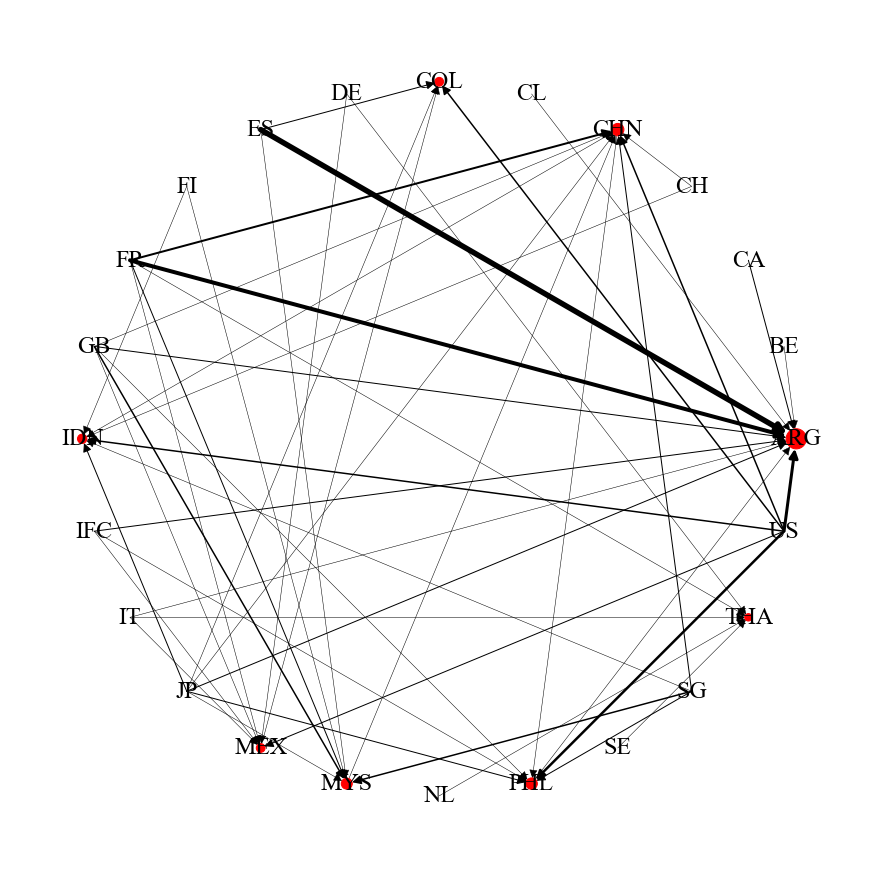

In [98]:
top10_indegree = list(new_indegree_merged_data['1990-1994'].sort_values(ascending=False)[:8].index)
top10_number = list(new_indegree_merged_data['1990-1994'].sort_values(ascending=False)[:8])
target = new_all_weight_country[0]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['1990-1994'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\indegree1.png", dpi=1000)
plt.show()

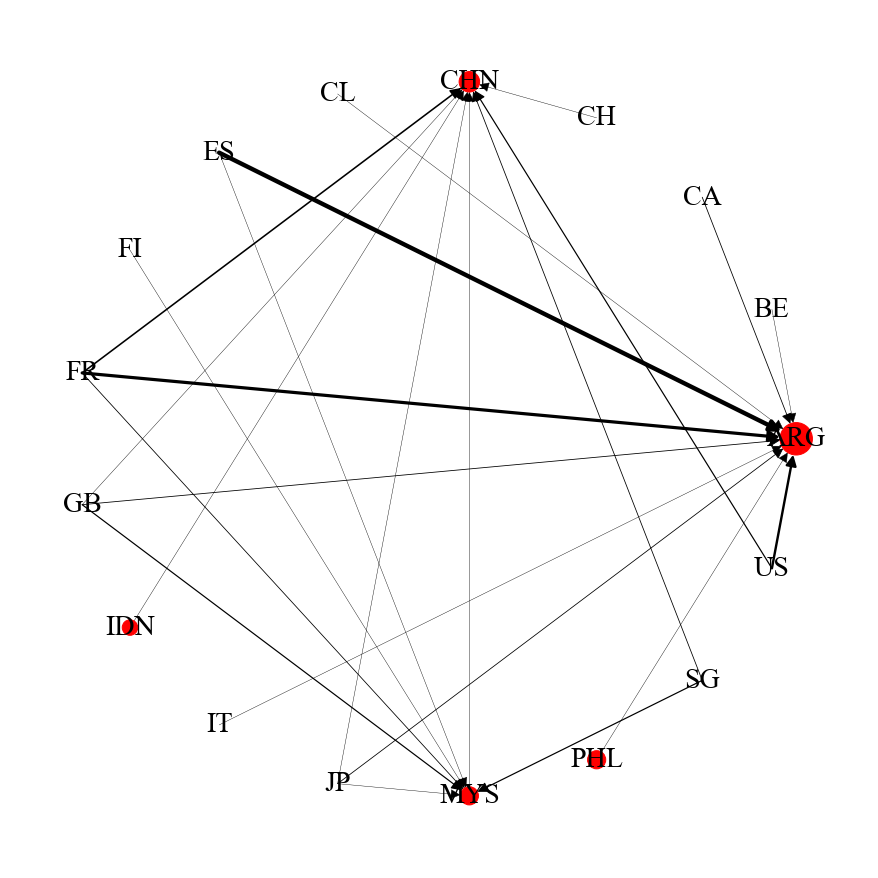

In [76]:
top10_indegree = list(new_indegree_merged_data['1990-1994'].sort_values(ascending=False)[:3].index)
top10_number = list(new_indegree_merged_data['1990-1994'].sort_values(ascending=False)[:3])
target = new_all_weight_country[0]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['1990-1994'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax, node_color='red',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\indegree1.png", dpi=600)
plt.show()

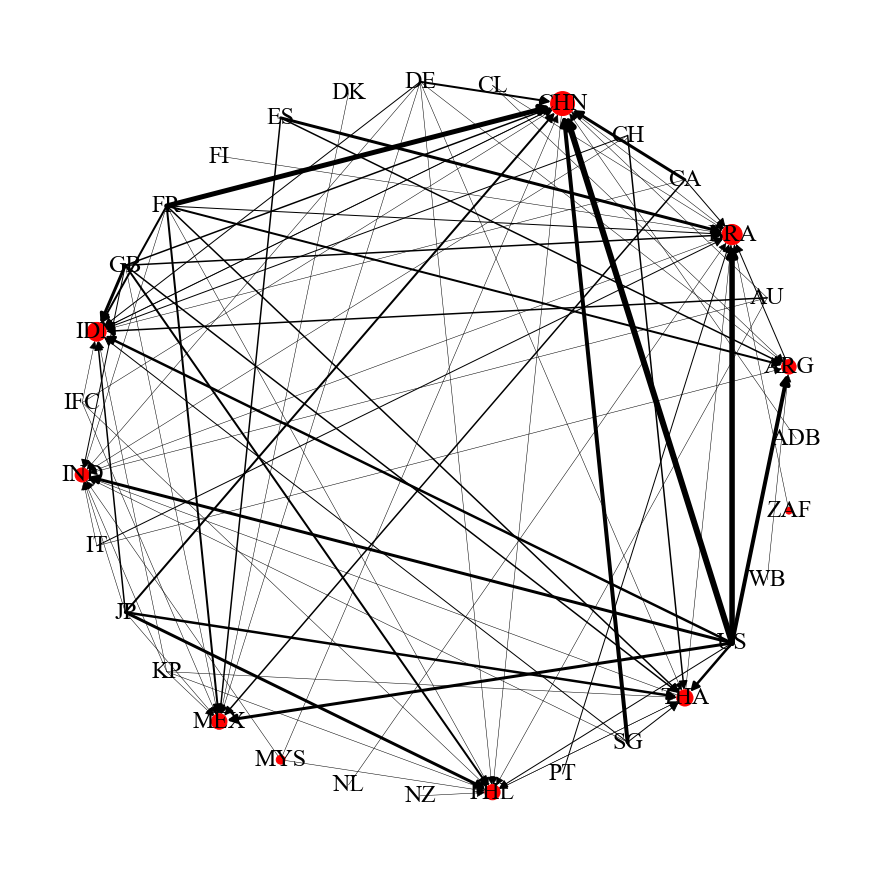

In [99]:
top10_indegree = list(new_indegree_merged_data['1995-1999'].sort_values(ascending=False)[:8].index)
top10_number = list(new_indegree_merged_data['1995-1999'].sort_values(ascending=False)[:8])
target = new_all_weight_country[1]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['1995-1999'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\indegree2.png", dpi=1000)
plt.show()

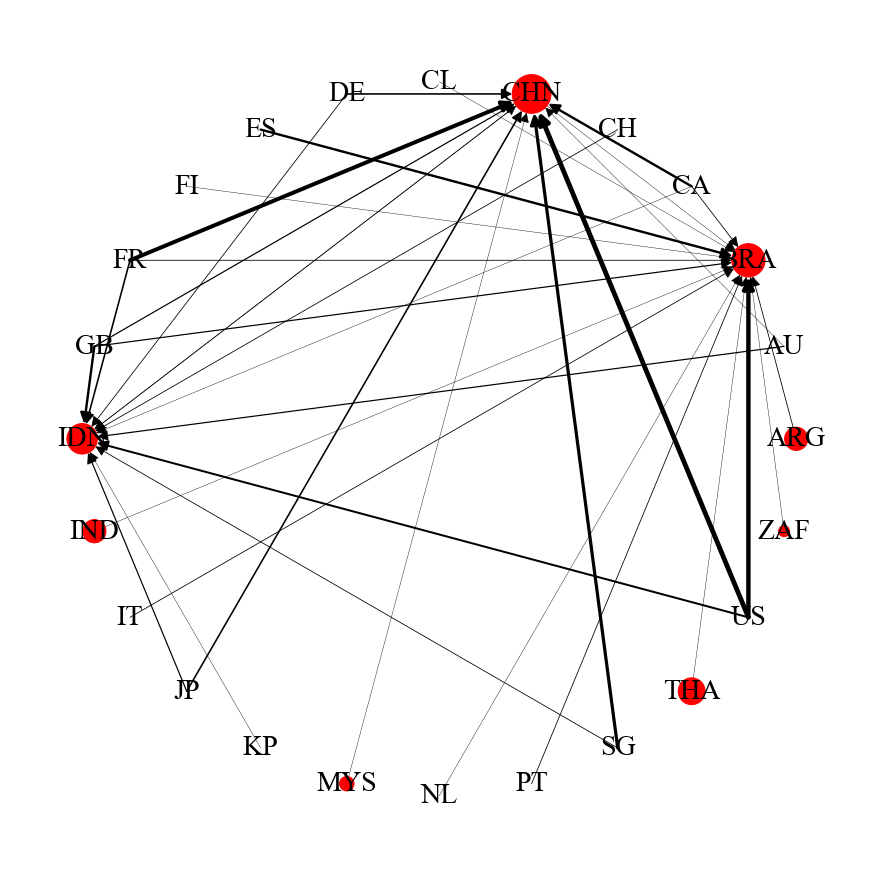

In [78]:
top10_indegree = list(new_indegree_merged_data['1995-1999'].sort_values(ascending=False)[:3].index)
top10_number = list(new_indegree_merged_data['1995-1999'].sort_values(ascending=False)[:3])
target = new_all_weight_country[1]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['1995-1999'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\indegree2.png", dpi=600)
plt.show()

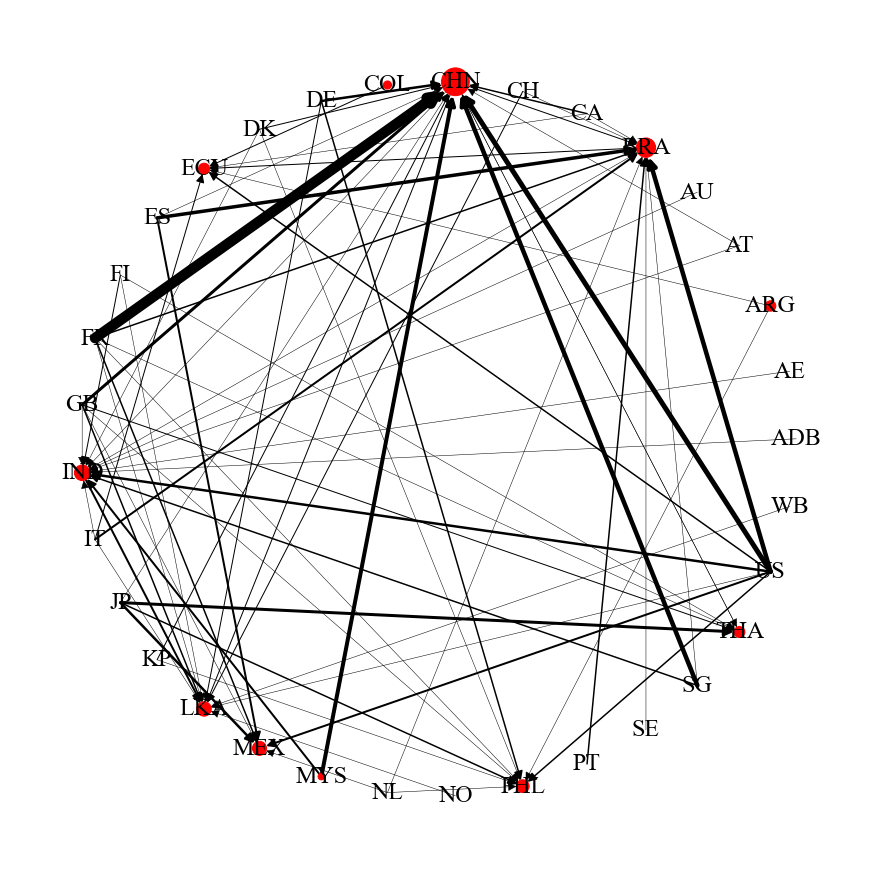

In [100]:
top10_indegree = list(new_indegree_merged_data['2000-2004'].sort_values(ascending=False)[:8].index)
top10_number = list(new_indegree_merged_data['2000-2004'].sort_values(ascending=False)[:8])
target = new_all_weight_country[2]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['2000-2004'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\indegree3.png", dpi=1000)
plt.show()

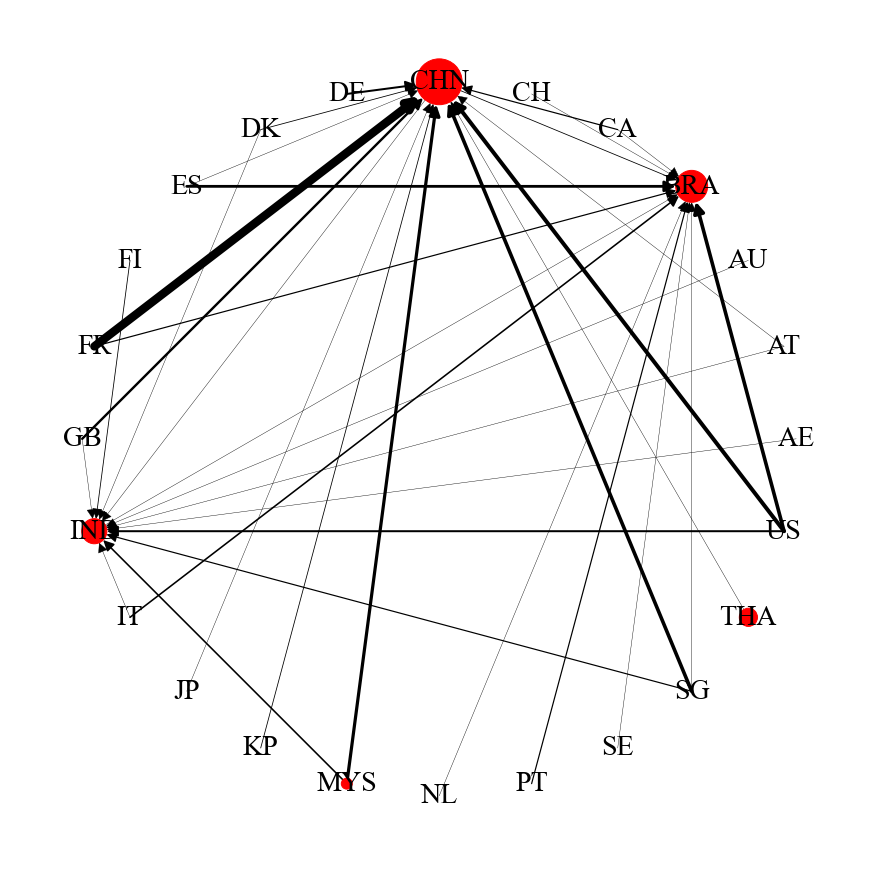

In [79]:
top10_indegree = list(new_indegree_merged_data['2000-2004'].sort_values(ascending=False)[:3].index)
top10_number = list(new_indegree_merged_data['2000-2004'].sort_values(ascending=False)[:3])
target = new_all_weight_country[2]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['2000-2004'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\indegree3.png", dpi=600)
plt.show()

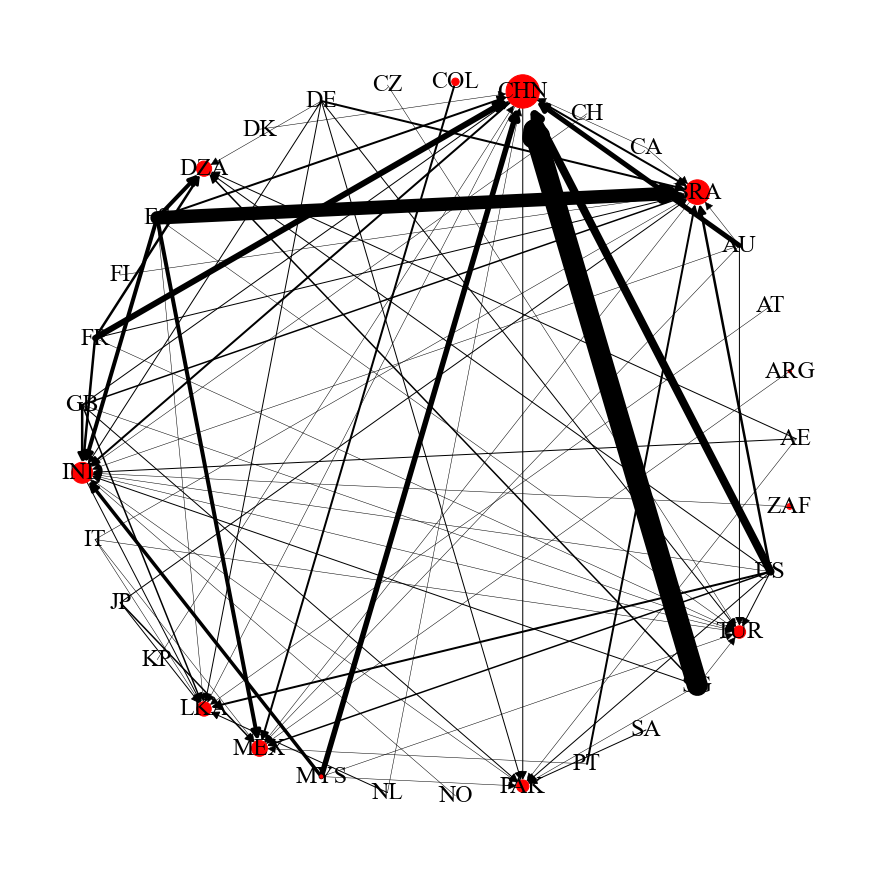

In [101]:
top10_indegree = list(new_indegree_merged_data['2005-2009'].sort_values(ascending=False)[:8].index)
top10_number = list(new_indegree_merged_data['2005-2009'].sort_values(ascending=False)[:8])
target = new_all_weight_country[3]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['2005-2009'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\indegree4.png", dpi=1000)
plt.show()

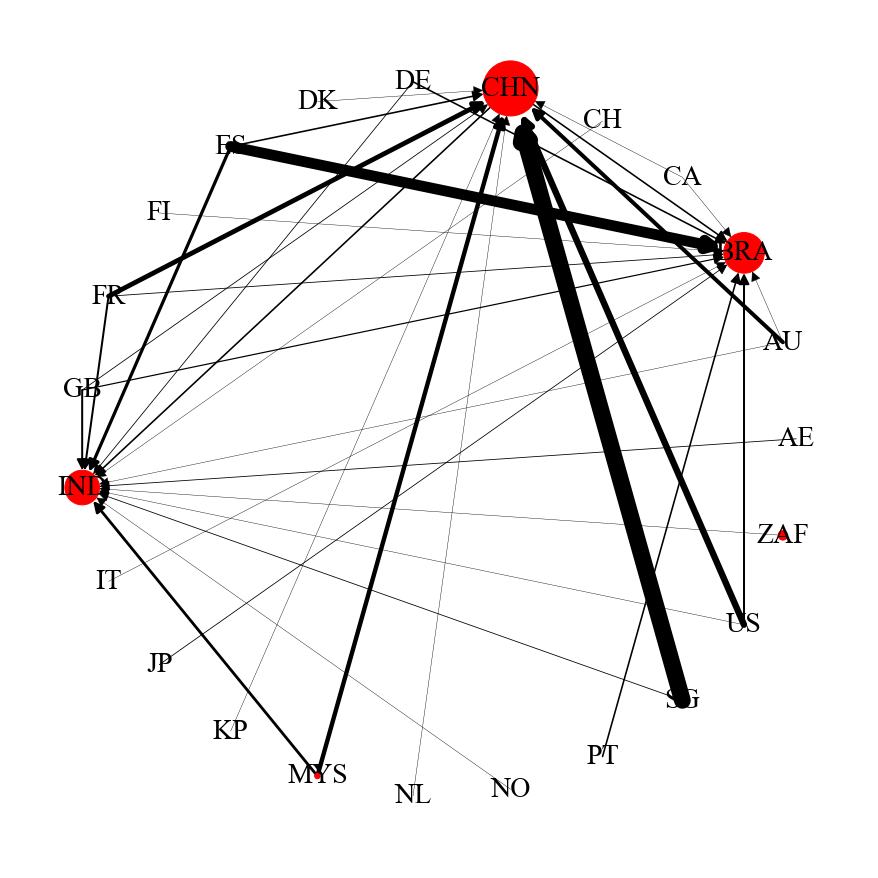

In [80]:
top10_indegree = list(new_indegree_merged_data['2005-2009'].sort_values(ascending=False)[:3].index)
top10_number = list(new_indegree_merged_data['2005-2009'].sort_values(ascending=False)[:3])
target = new_all_weight_country[3]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['2005-2009'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\indegree4.png", dpi=600)
plt.show()

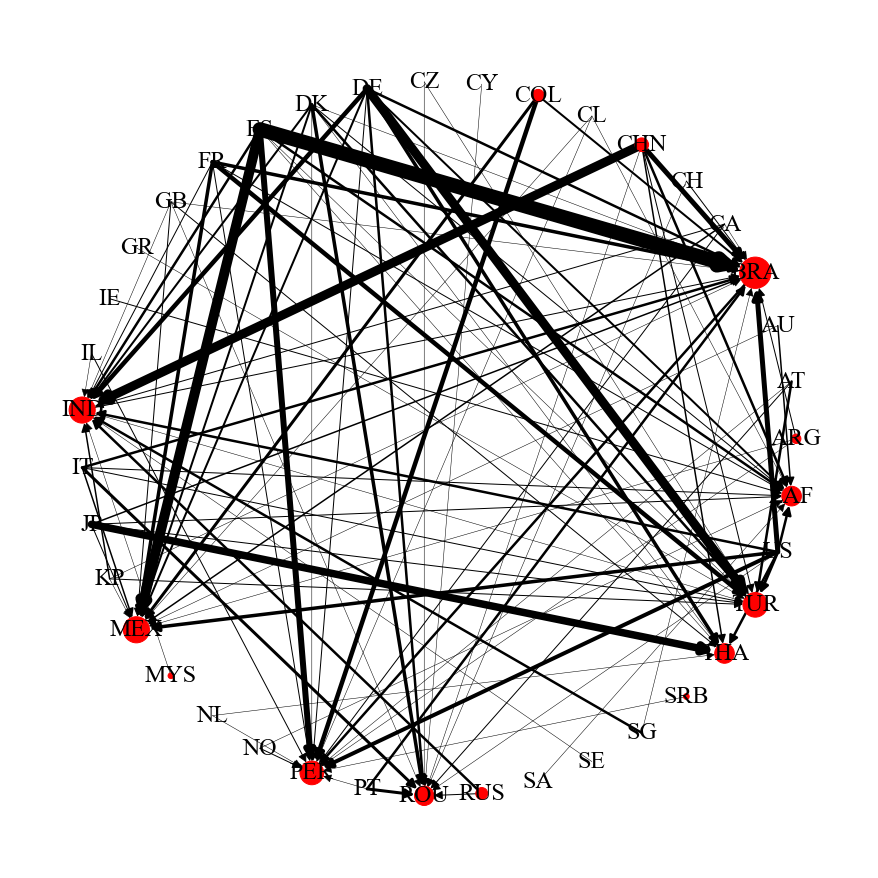

In [120]:
top10_indegree = list(new_indegree_merged_data['2010-2014'].sort_values(ascending=False)[:8].index)
top10_number = list(new_indegree_merged_data['2010-2014'].sort_values(ascending=False)[:8])
target = new_all_weight_country[4]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['2010-2014'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\indegree5.png", dpi=1000)
plt.show()

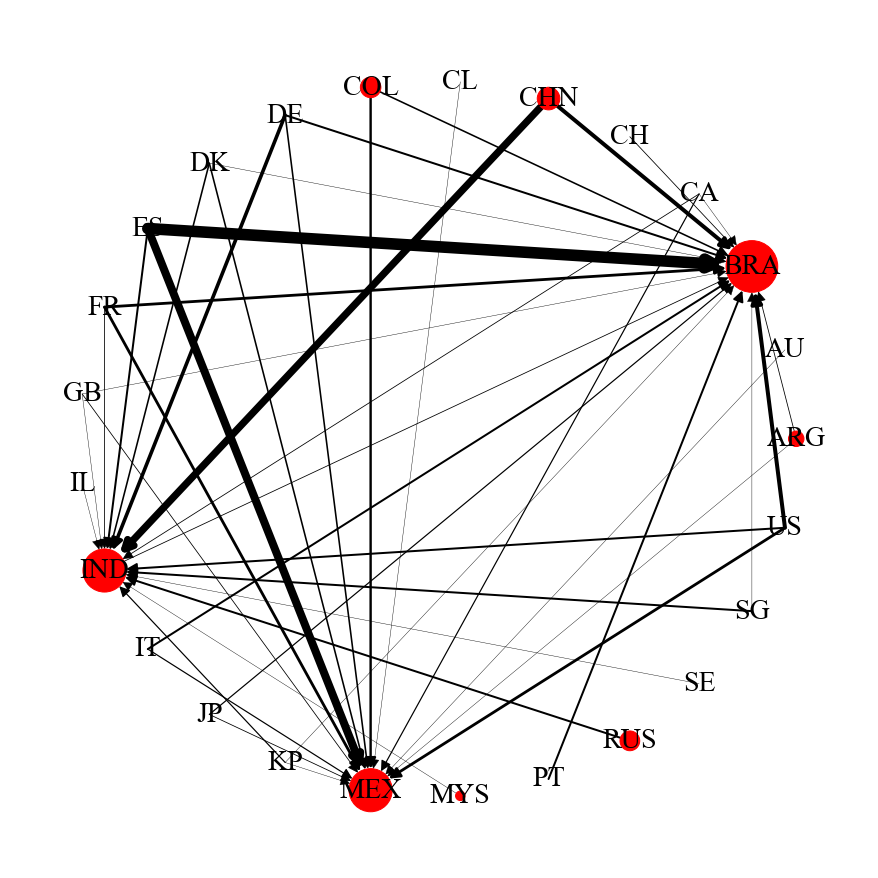

In [81]:
top10_indegree = list(new_indegree_merged_data['2010-2014'].sort_values(ascending=False)[:3].index)
top10_number = list(new_indegree_merged_data['2010-2014'].sort_values(ascending=False)[:3])
target = new_all_weight_country[4]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['2010-2014'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\indegree5.png", dpi=600)
plt.show()

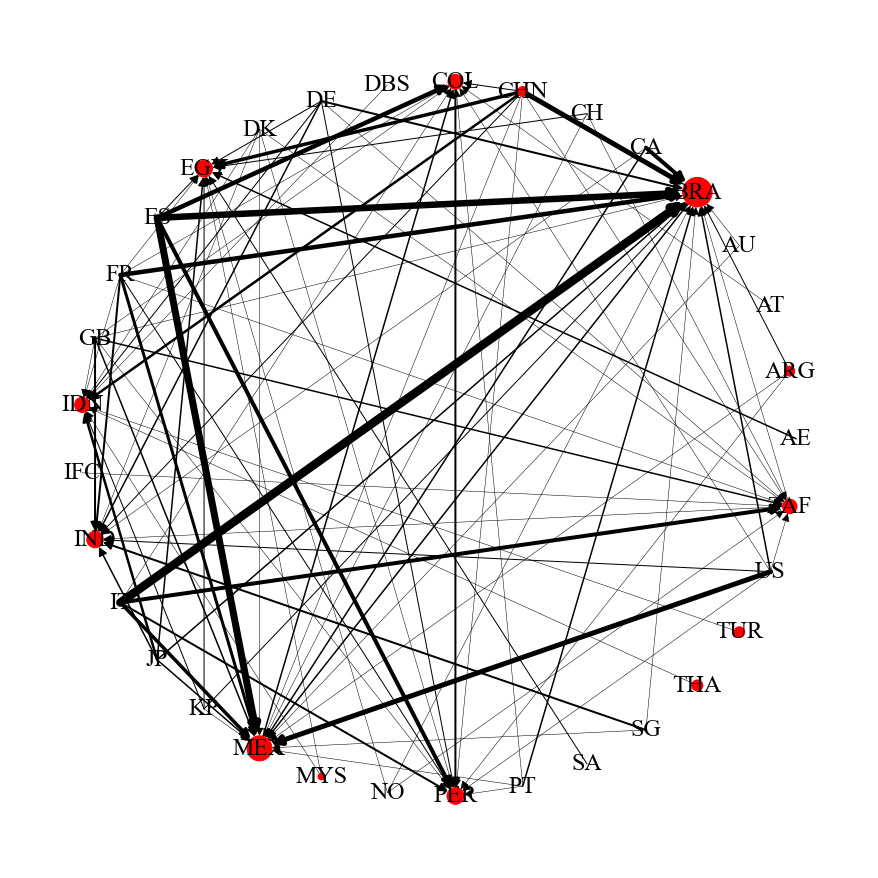

In [103]:
top10_indegree = list(new_indegree_merged_data['2015-2019'].sort_values(ascending=False)[:8].index)
top10_number = list(new_indegree_merged_data['2015-2019'].sort_values(ascending=False)[:8])
target = new_all_weight_country[5]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['2015-2019'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\indegree6.png", dpi=1000)
plt.show()

['ARG', 'AU', 'BRA', 'CA', 'CH', 'CHN', 'COL', 'DE', 'DK', 'ES', 'FR', 'GB', 'IT', 'JP', 'KP', 'MEX', 'NO', 'PER', 'PT', 'SG', 'US', 'ZAF']


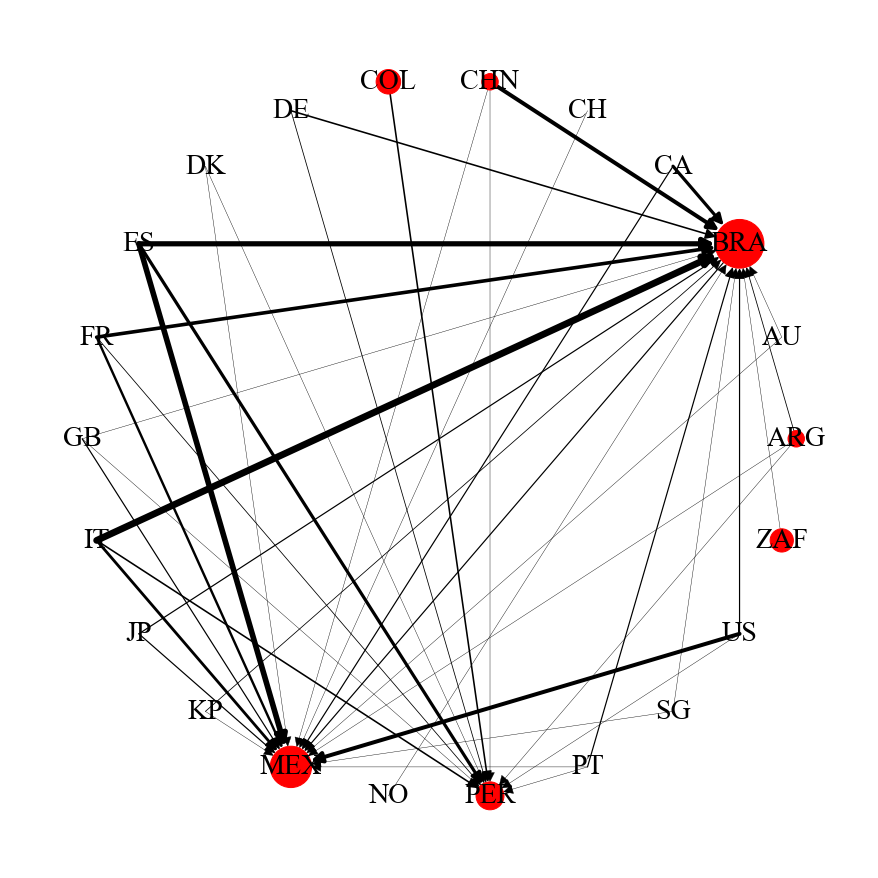

In [87]:
top10_indegree = list(new_indegree_merged_data['2015-2019'].sort_values(ascending=False)[:3].index)
top10_number = list(new_indegree_merged_data['2015-2019'].sort_values(ascending=False)[:3])
target = new_all_weight_country[5]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_indegree:
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_indegree_merged_data['2015-2019'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='red',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\indegree6.png", dpi=600)
plt.show()

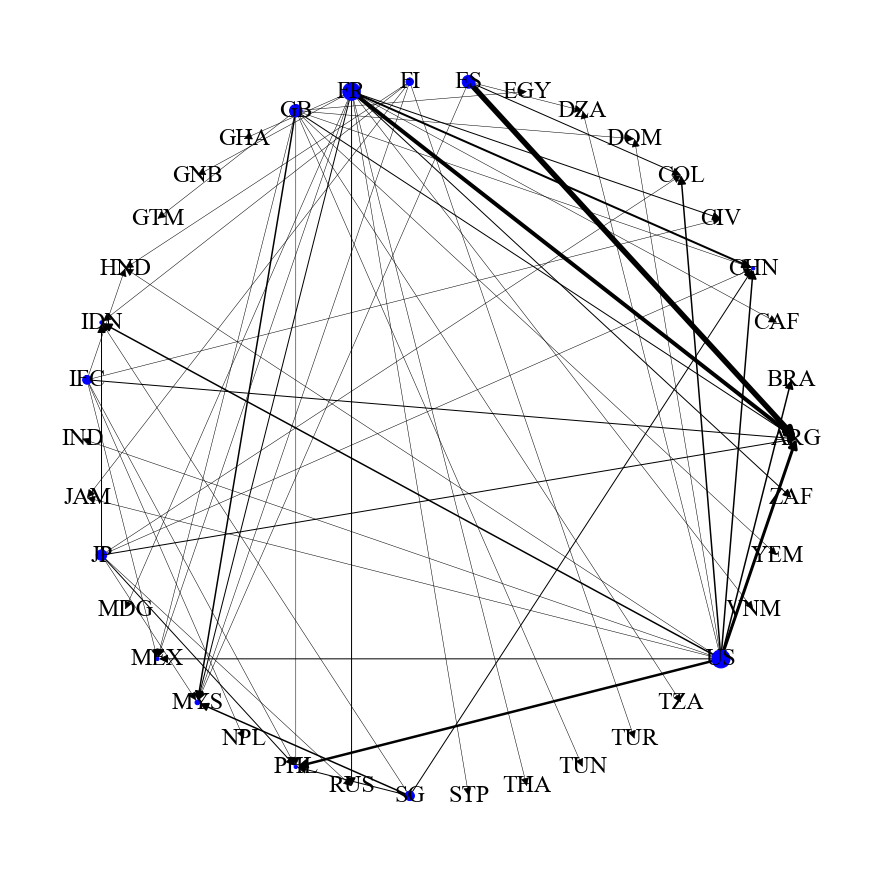

In [104]:
top10_outdegree = list(new_outdegree_merged_data['1990-1994'].sort_values(ascending=False)[:8].index)
top10_number = list(new_outdegree_merged_data['1990-1994'].sort_values(ascending=False)[:8])
target = new_all_weight_country[0]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_outdegree_merged_data['1990-1994'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\outdegree1.png", dpi=1000)
plt.show()

26


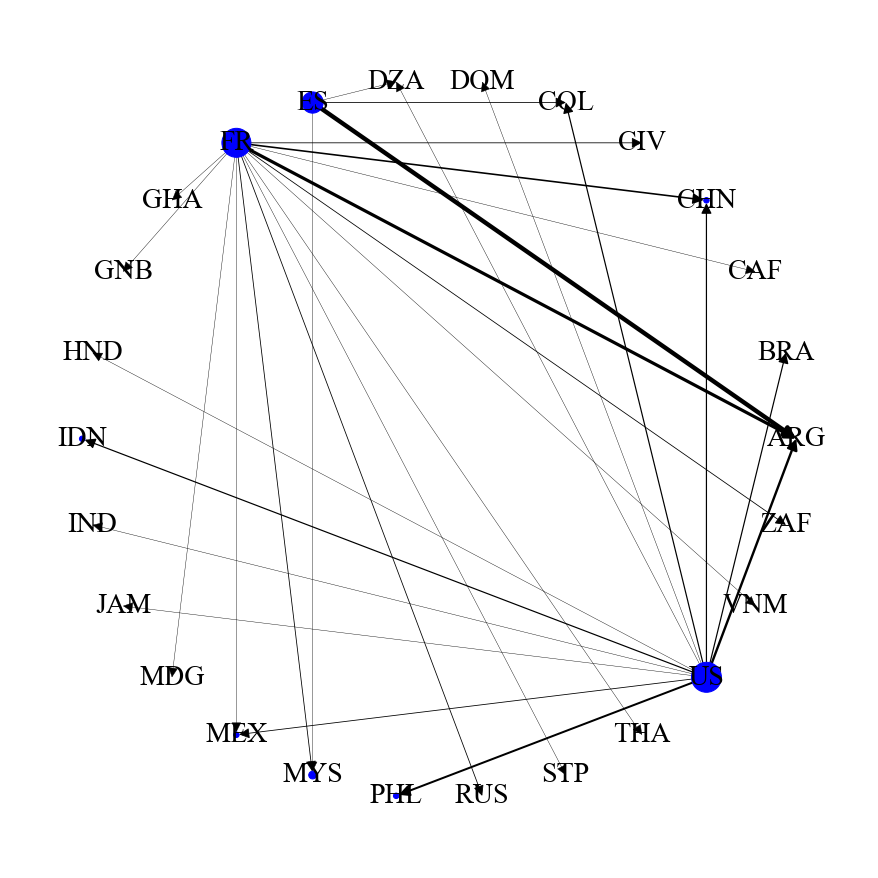

In [119]:
top10_outdegree = list(new_outdegree_merged_data['1990-1994'].sort_values(ascending=False)[:3].index)
top10_number = list(new_outdegree_merged_data['1990-1994'].sort_values(ascending=False)[:3])
target = new_all_weight_country[0]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
print(len(nodes))
node_size = [new_outdegree_merged_data['1990-1994'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
#plt.savefig(r"C:\PPP\Thesis\Paper4\outdegree1.png", dpi=600)
plt.show()

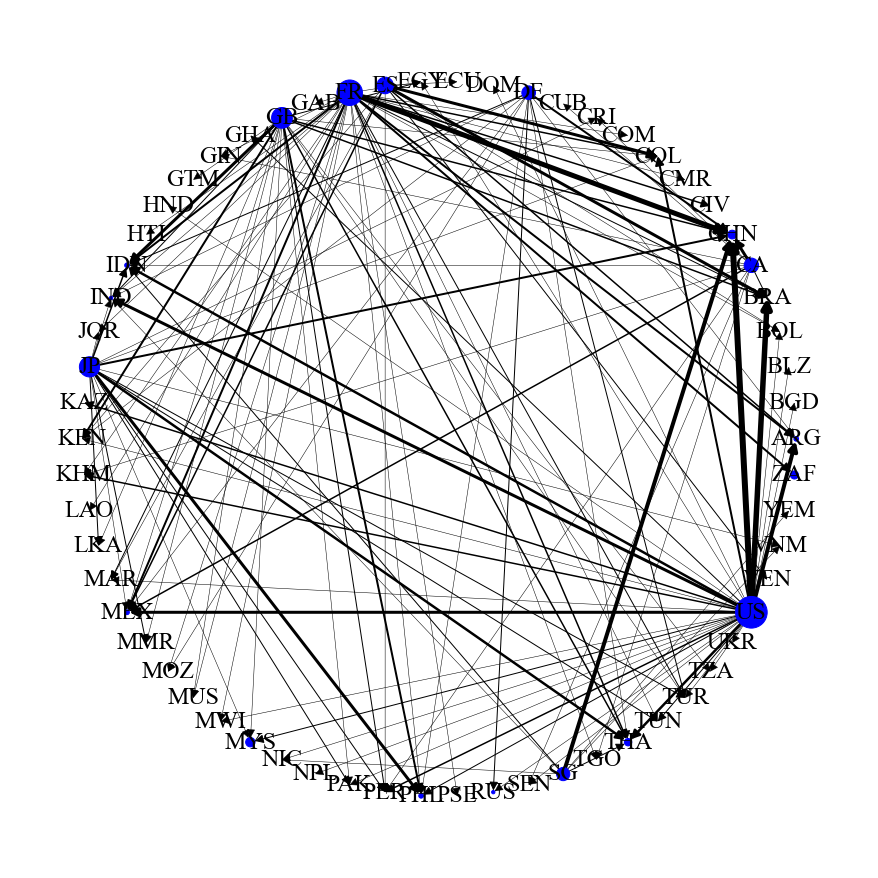

In [105]:
top10_outdegree = list(new_outdegree_merged_data['1995-1999'].sort_values(ascending=False)[:8].index)
top10_number = list(new_outdegree_merged_data['1995-1999'].sort_values(ascending=False)[:8])
target =new_all_weight_country[1]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_outdegree_merged_data['1995-1999'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\outdegree2.png", dpi=1000)
plt.show()

51


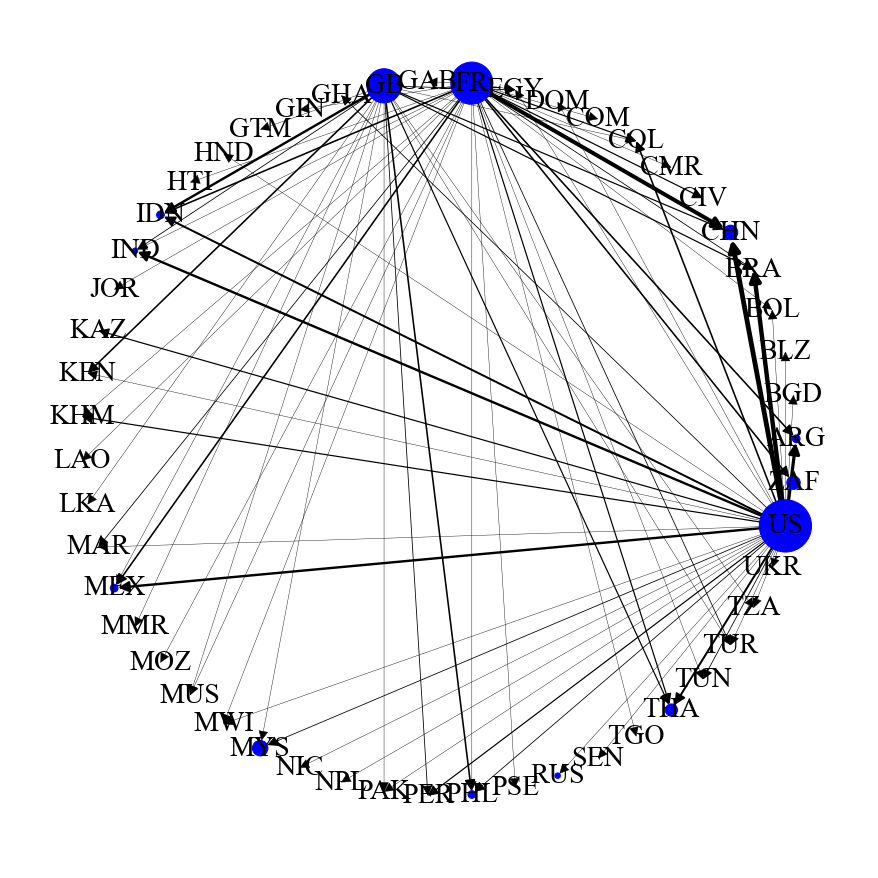

In [120]:
top10_outdegree = list(new_outdegree_merged_data['1995-1999'].sort_values(ascending=False)[:3].index)
top10_number = list(new_outdegree_merged_data['1995-1999'].sort_values(ascending=False)[:3])
target =new_all_weight_country[1]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
print(len(nodes))
node_size = [new_outdegree_merged_data['1995-1999'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
#plt.savefig(r"C:\PPP\Thesis\Paper4\outdegree2.png", dpi=600)
plt.show()

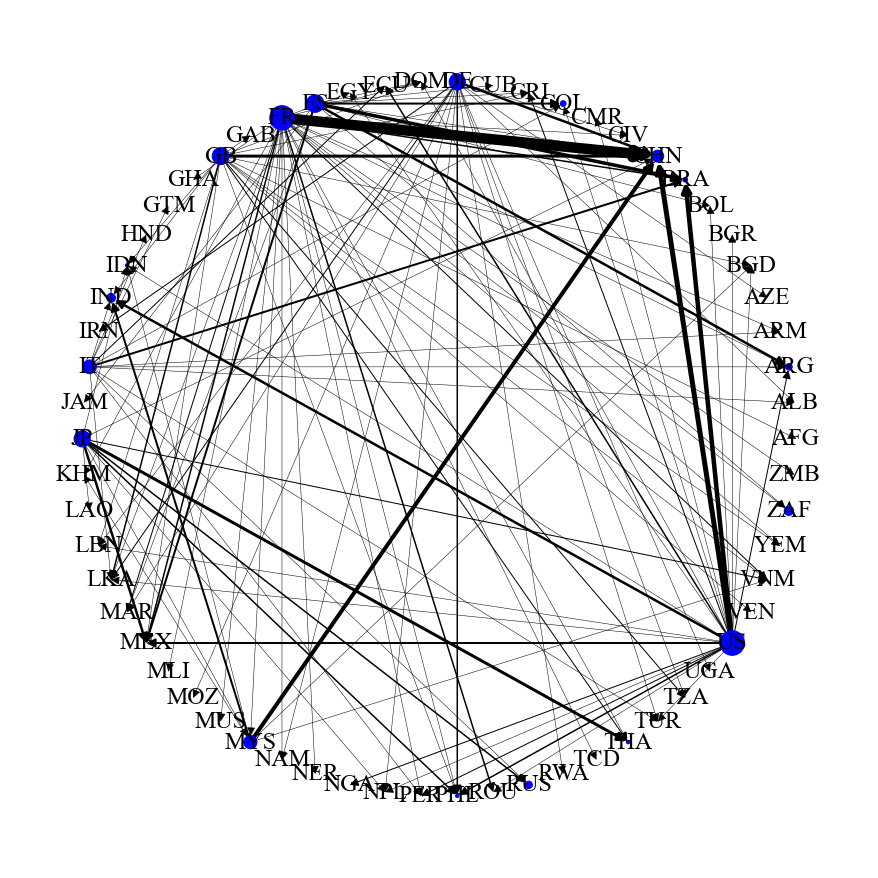

In [106]:
top10_outdegree = list(new_outdegree_merged_data['2000-2004'].sort_values(ascending=False)[:8].index)
top10_number = list(new_outdegree_merged_data['2000-2004'].sort_values(ascending=False)[:8])
target = new_all_weight_country[2]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_outdegree_merged_data['2000-2004'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\outdegree3.png", dpi=1000)
plt.show()

44


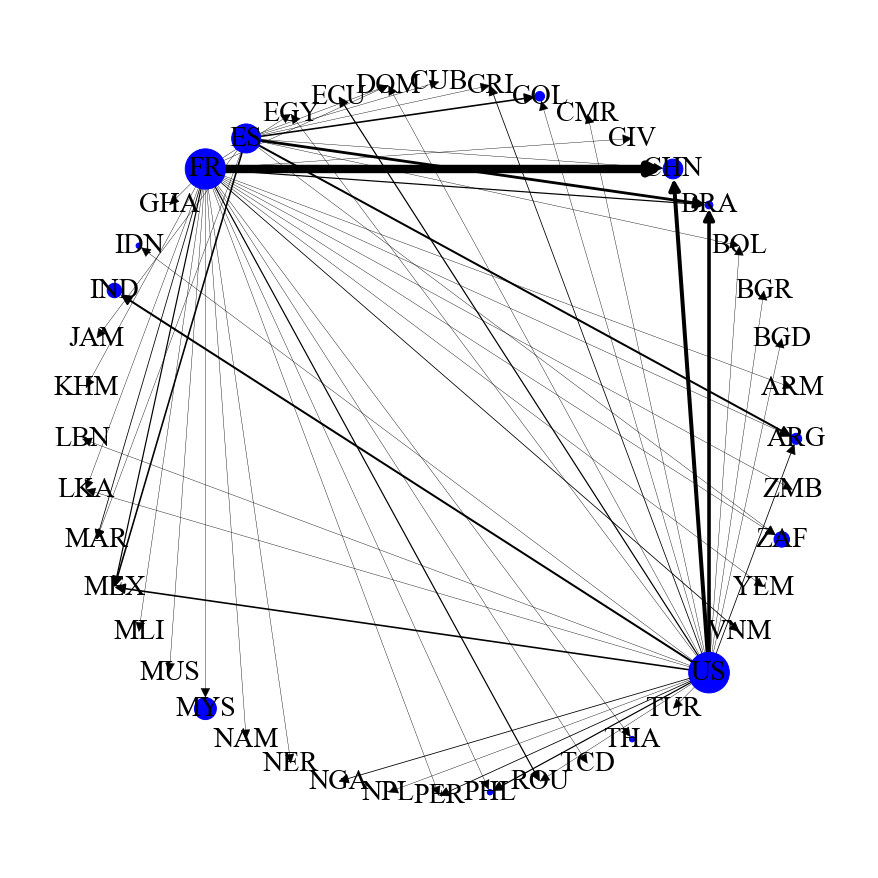

In [121]:
top10_outdegree = list(new_outdegree_merged_data['2000-2004'].sort_values(ascending=False)[:3].index)
top10_number = list(new_outdegree_merged_data['2000-2004'].sort_values(ascending=False)[:3])
target = new_all_weight_country[2]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
print(len(nodes))
node_size = [new_outdegree_merged_data['2000-2004'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
#plt.savefig(r"C:\PPP\Thesis\Paper4\outdegree3.png", dpi=600)
plt.show()

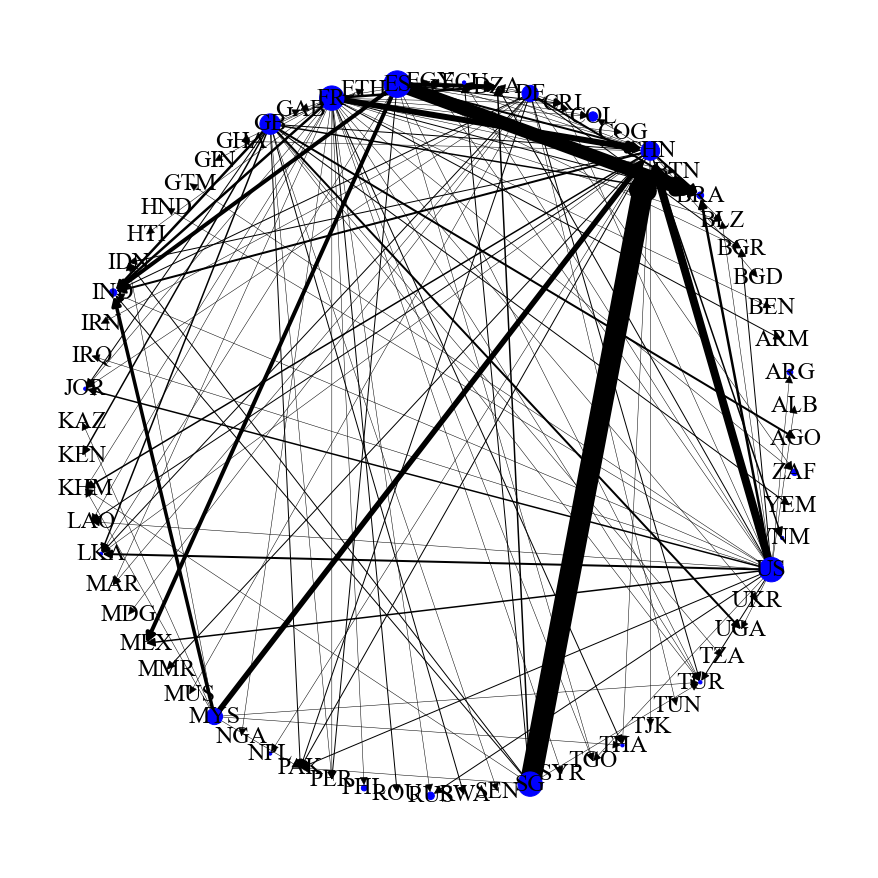

In [107]:
top10_outdegree = list(new_outdegree_merged_data['2005-2009'].sort_values(ascending=False)[:8].index)
top10_number = list(new_outdegree_merged_data['2005-2009'].sort_values(ascending=False)[:8])
target = new_all_weight_country[3]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_outdegree_merged_data['2005-2009'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\outdegree4.png", dpi=1000)
plt.show()

40


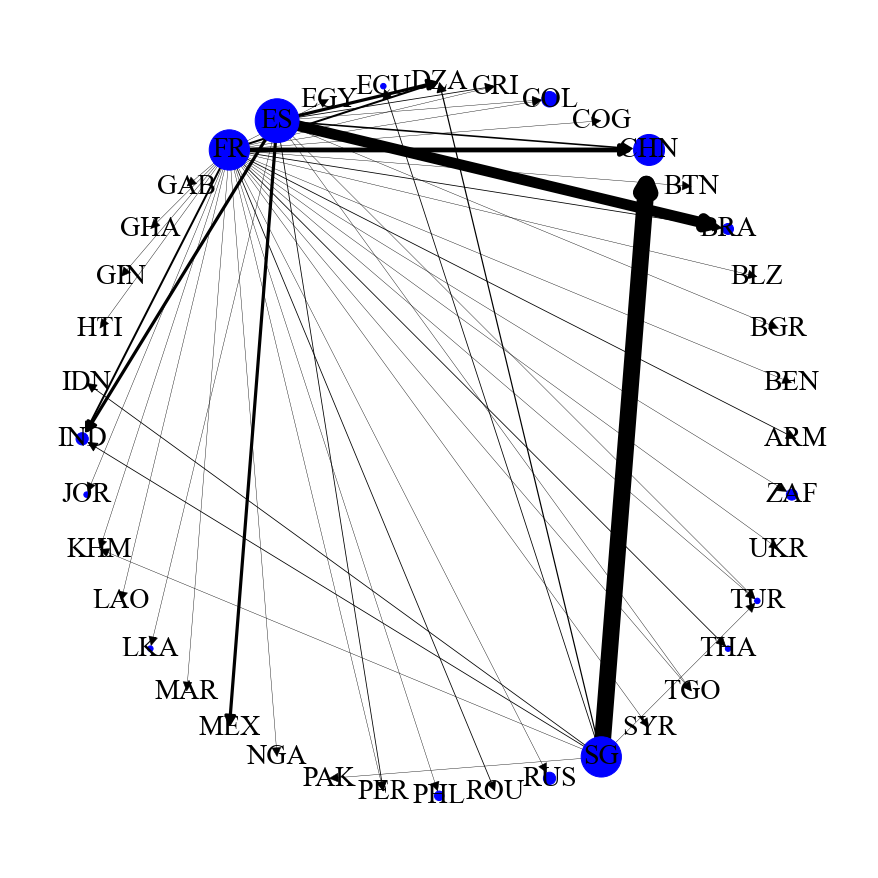

In [122]:
top10_outdegree = list(new_outdegree_merged_data['2005-2009'].sort_values(ascending=False)[:3].index)
top10_number = list(new_outdegree_merged_data['2005-2009'].sort_values(ascending=False)[:3])
target = new_all_weight_country[3]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
print(len(nodes))
node_size = [new_outdegree_merged_data['2005-2009'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
#plt.savefig(r"C:\PPP\Thesis\Paper4\outdegree4.png", dpi=600)
plt.show()

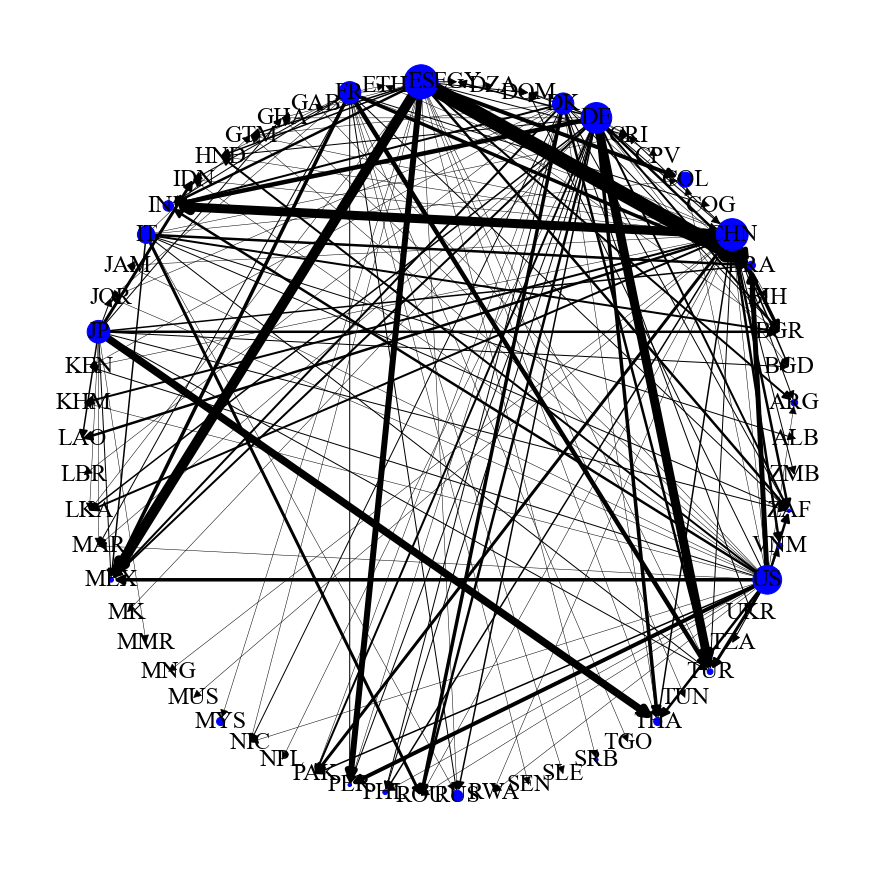

In [160]:
top10_outdegree = list(new_outdegree_merged_data['2010-2014'].sort_values(ascending=False)[:8].index)
top10_number = list(new_outdegree_merged_data['2010-2014'].sort_values(ascending=False)[:8])
target = new_all_weight_country[4]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_outdegree_merged_data['2010-2014'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\outdegree5.png", dpi=1000)
plt.show()

44


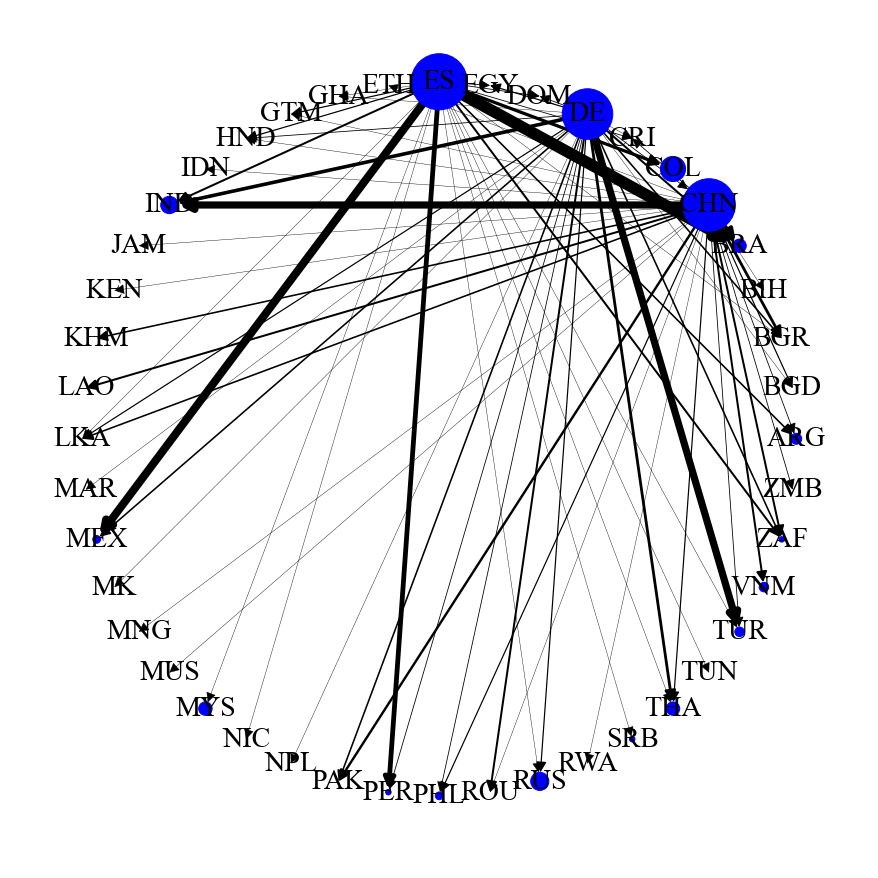

In [123]:
top10_outdegree = list(new_outdegree_merged_data['2010-2014'].sort_values(ascending=False)[:3].index)
top10_number = list(new_outdegree_merged_data['2010-2014'].sort_values(ascending=False)[:3])
target = new_all_weight_country[4]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
print(len(nodes))
node_size = [new_outdegree_merged_data['2010-2014'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
#plt.savefig(r"C:\PPP\Thesis\Paper4\outdegree5.png", dpi=600)
plt.show()

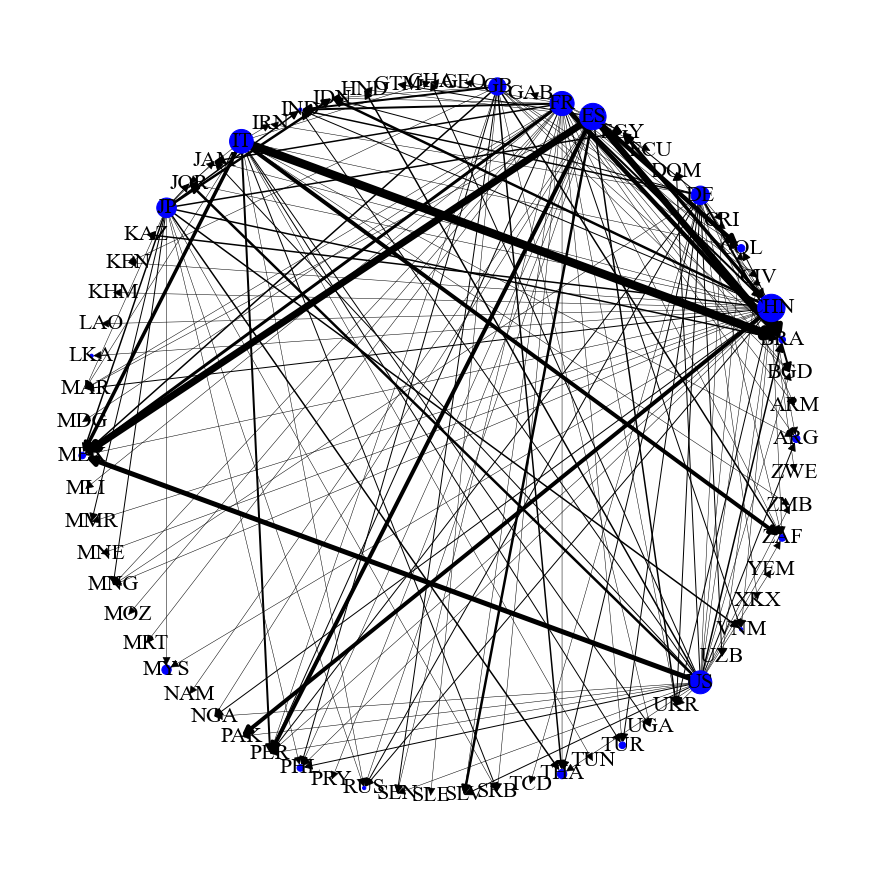

In [159]:
top10_outdegree = list(new_outdegree_merged_data['2015-2019'].sort_values(ascending=False)[:8].index)
top10_number = list(new_outdegree_merged_data['2015-2019'].sort_values(ascending=False)[:8])
target = new_all_weight_country[5]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_outdegree_merged_data['2015-2019'].loc[node]*11 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=22, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\outdegree6.png", dpi=1000)
plt.show()

52


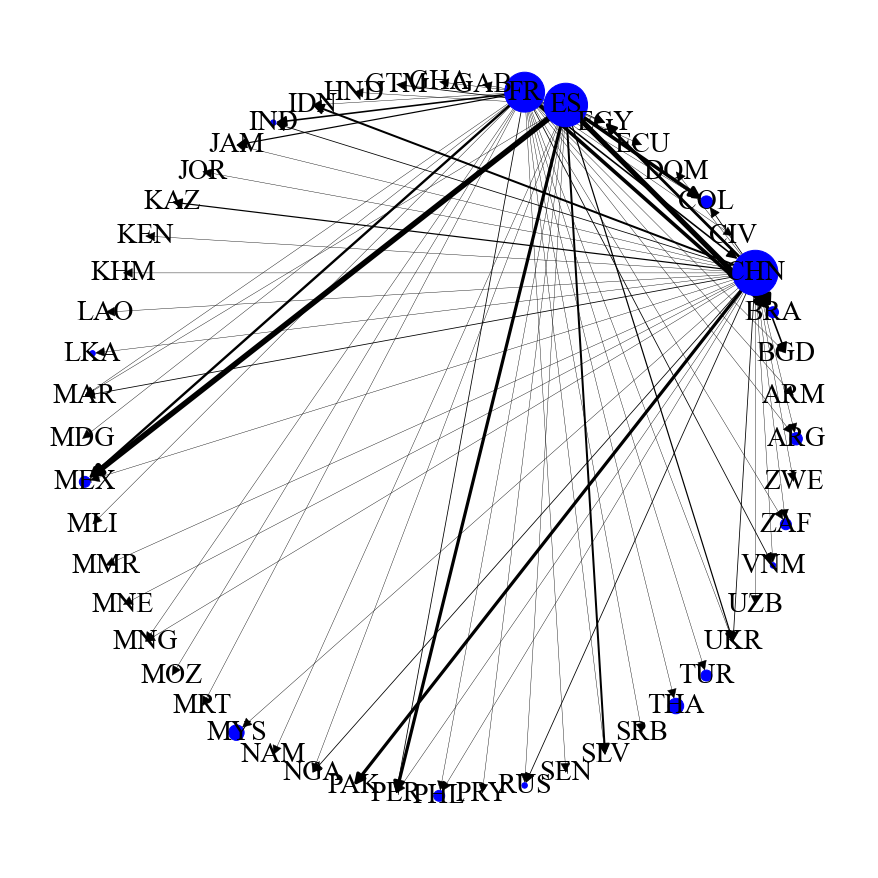

In [124]:
top10_outdegree = list(new_outdegree_merged_data['2015-2019'].sort_values(ascending=False)[:3].index)
top10_number = list(new_outdegree_merged_data['2015-2019'].sort_values(ascending=False)[:3])
target = new_all_weight_country[5]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
print(len(nodes))
node_size = [new_outdegree_merged_data['2015-2019'].loc[node]*30 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='blue',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
#plt.savefig(r"C:\PPP\Thesis\Paper4\outdegree6.png", dpi=600)
plt.show()

In [134]:
top10_outdegree = list(new_pagerank_merged_data['1990-1994'].sort_values(ascending=False)[:8].index)
top10_number = list(new_pagerank_merged_data['1990-1994'].sort_values(ascending=False)[:8])
target = new_all_weight_country[0]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

In [135]:
new_all_weight_country[0]

,outcountry,weight,incountry
0,US,1,JAM
1,FI,1,JAM
2,FI,1,TUR
3,GB,1,GTM
4,ADB,1,NPL
...,...,...,...
74,MYS,1,TZA
75,GB,1,TZA
76,GB,1,TUN
77,US,3,BRA


In [132]:
top10_outdegree

['ARG', 'PHL', 'CHN', 'THA', 'COL', 'NPL', 'MEX', 'IDN']

In [126]:
in_list

['ARG', 'PHL', 'COL', 'CHN']

In [127]:
out_list

['PHL', 'CHN', 'MEX', 'IDN']

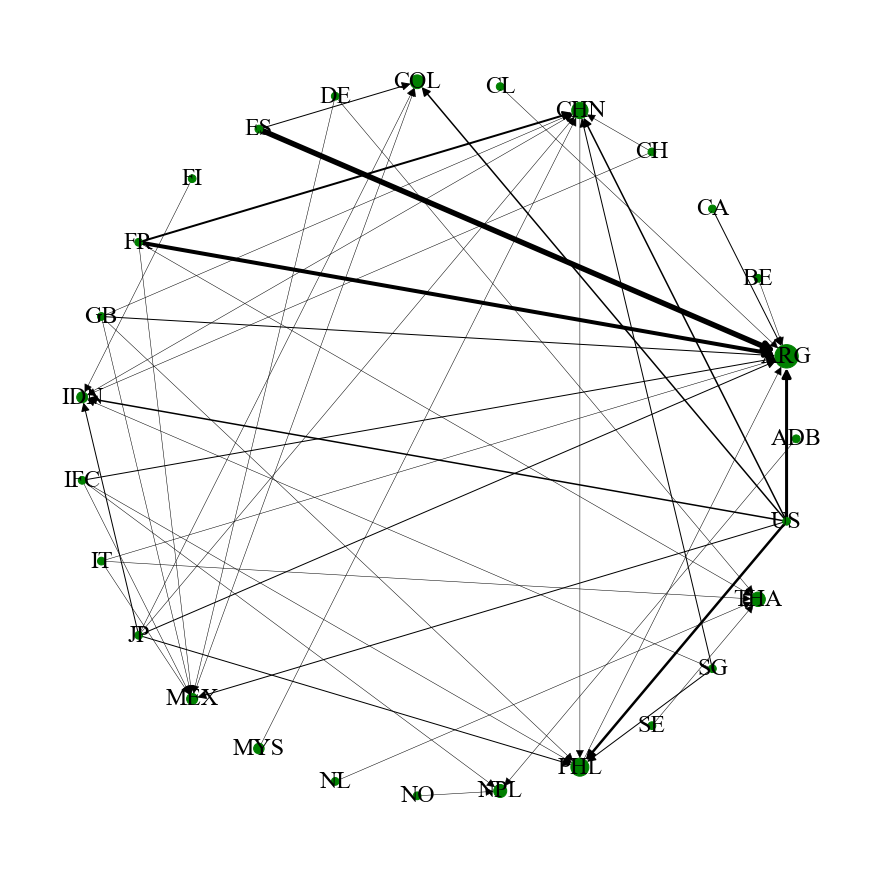

In [151]:
top10_outdegree = list(new_pagerank_merged_data['1990-1994'].sort_values(ascending=False)[:8].index)
top10_number = list(new_pagerank_merged_data['1990-1994'].sort_values(ascending=False)[:8])
target = new_all_weight_country[0]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['1990-1994'].loc[node]*400 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\pagerank1.png", dpi=1000)
plt.show()

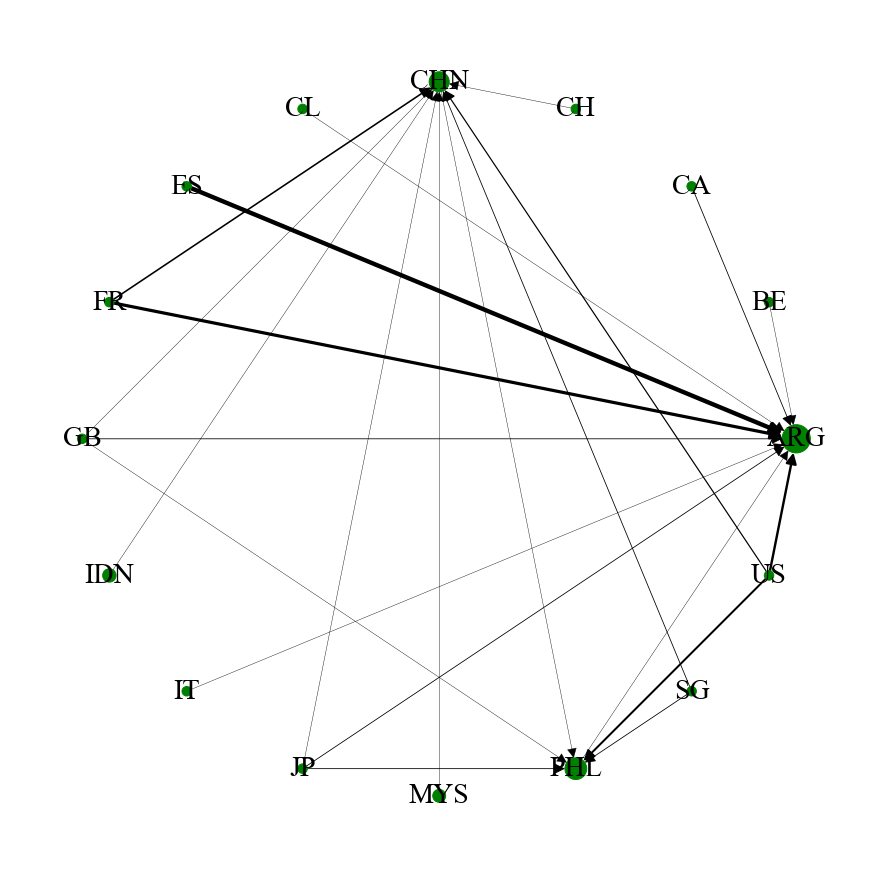

In [112]:
top10_outdegree = list(new_pagerank_merged_data['1990-1994'].sort_values(ascending=False)[:3].index)
top10_number = list(new_pagerank_merged_data['1990-1994'].sort_values(ascending=False)[:3])
target = new_all_weight_country[0]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['1990-1994'].loc[node]*600 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\pagerank1.png", dpi=600)
plt.show()

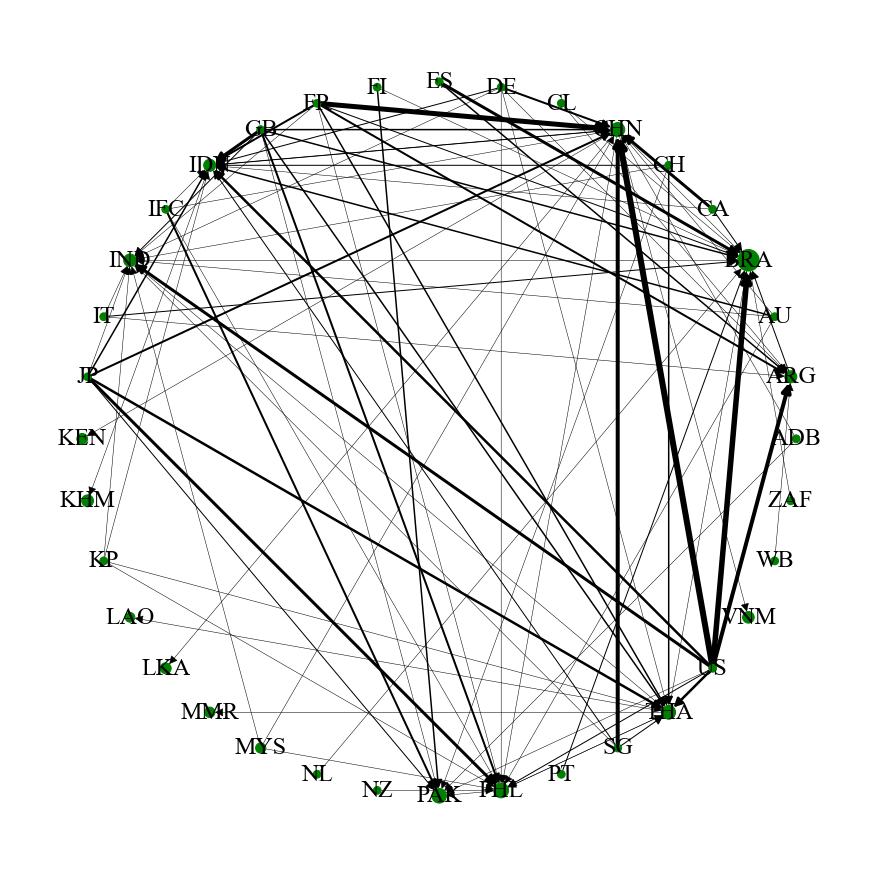

In [152]:
top10_outdegree = list(new_pagerank_merged_data['1995-1999'].sort_values(ascending=False)[:8].index)
top10_number = list(new_pagerank_merged_data['1995-1999'].sort_values(ascending=False)[:8])
target = new_all_weight_country[1]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['1995-1999'].loc[node]*400 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\pagerank2.png", dpi=1000)
plt.show()

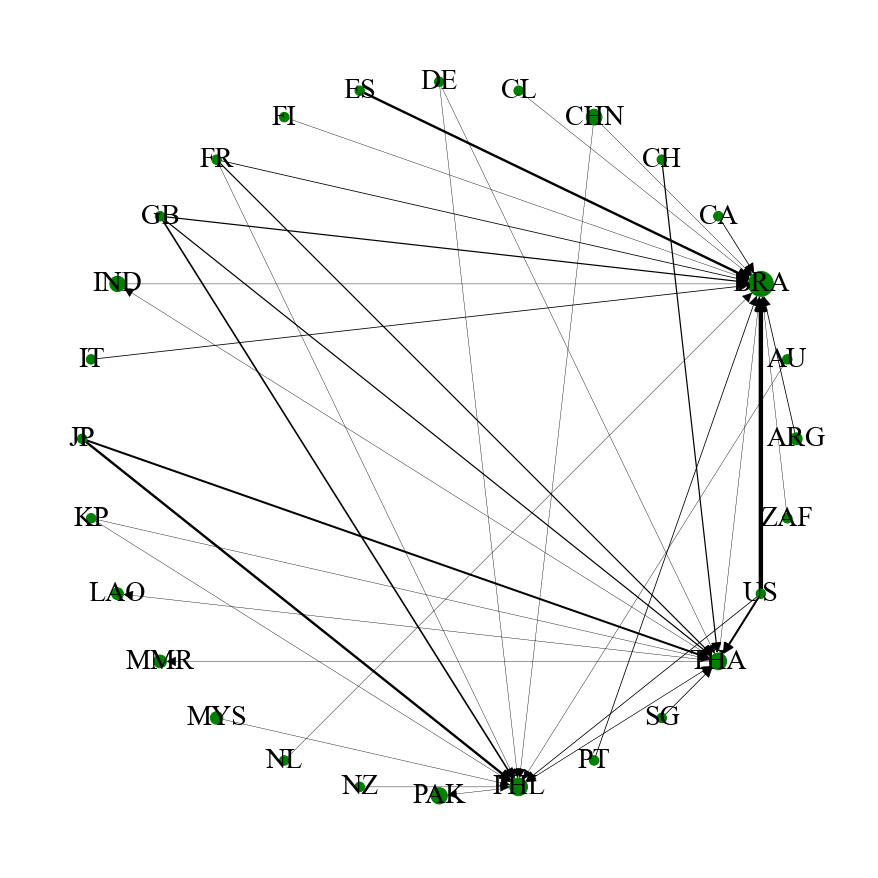

In [113]:
top10_outdegree = list(new_pagerank_merged_data['1995-1999'].sort_values(ascending=False)[:3].index)
top10_number = list(new_pagerank_merged_data['1995-1999'].sort_values(ascending=False)[:3])
target = new_all_weight_country[1]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['1995-1999'].loc[node]*600 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\pagerank2.png", dpi=600)
plt.show()

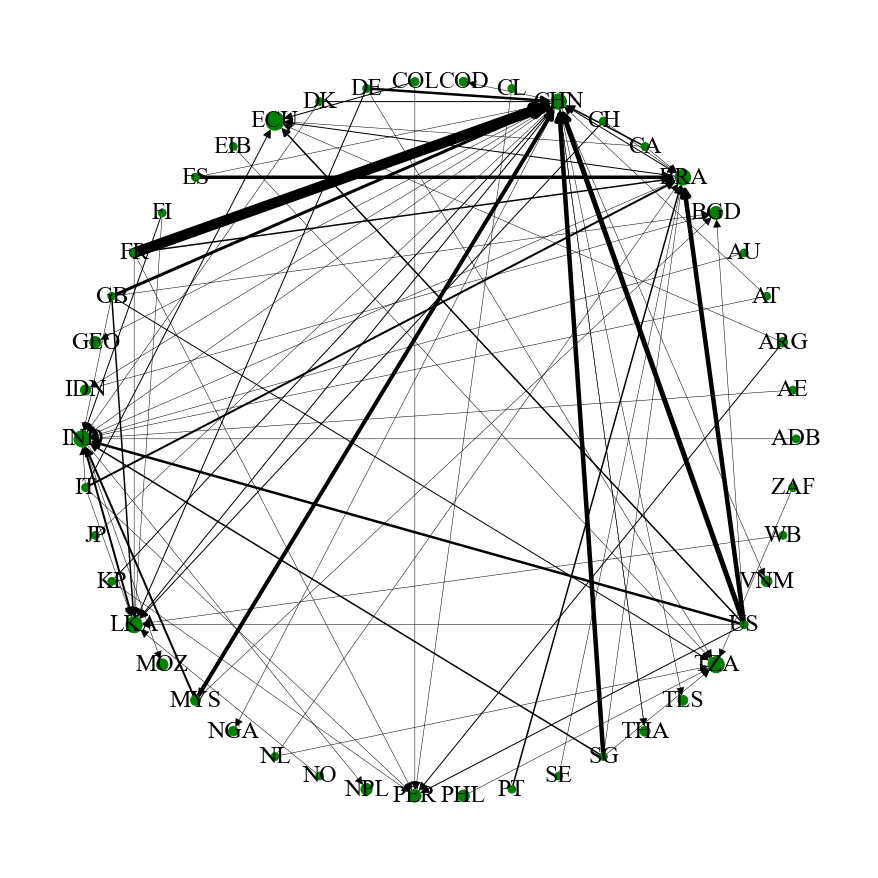

In [153]:
top10_outdegree = list(new_pagerank_merged_data['2000-2004'].sort_values(ascending=False)[:8].index)
top10_number = list(new_pagerank_merged_data['2000-2004'].sort_values(ascending=False)[:8])
target = new_all_weight_country[2]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['2000-2004'].loc[node]*400 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\pagerank3.png", dpi=1000)
plt.show()

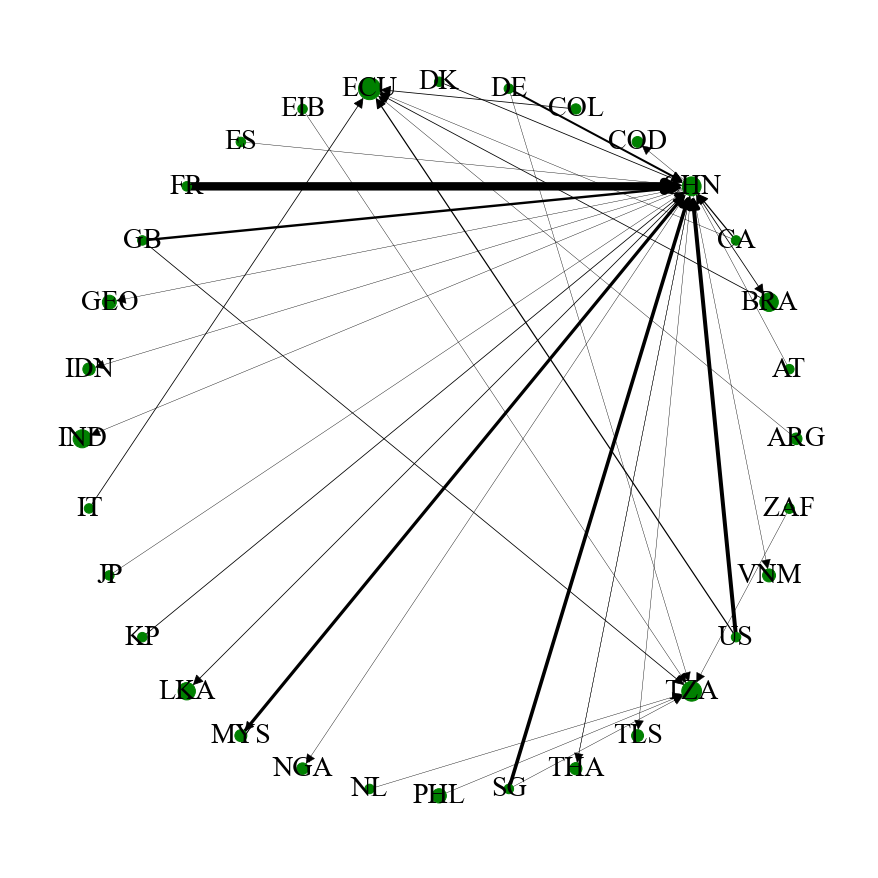

In [114]:
top10_outdegree = list(new_pagerank_merged_data['2000-2004'].sort_values(ascending=False)[:3].index)
top10_number = list(new_pagerank_merged_data['2000-2004'].sort_values(ascending=False)[:3])
target = new_all_weight_country[2]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['2000-2004'].loc[node]*600 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\pagerank3.png", dpi=600)
plt.show()

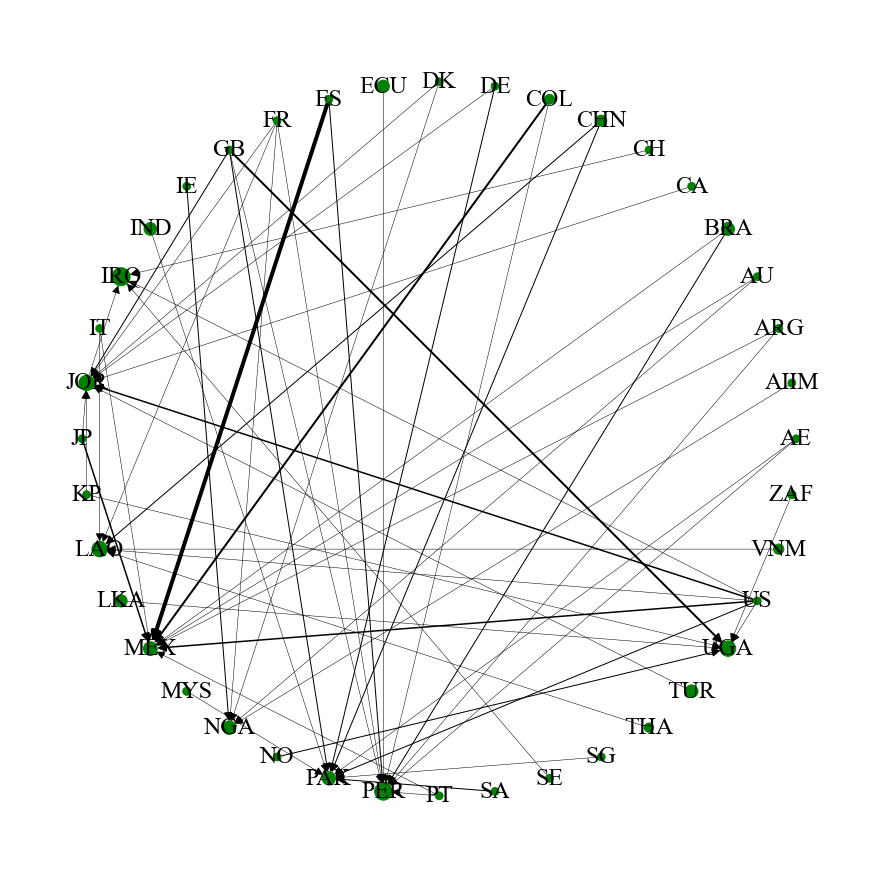

In [154]:
top10_outdegree = list(new_pagerank_merged_data['2005-2009'].sort_values(ascending=False)[:8].index)
top10_number = list(new_pagerank_merged_data['2005-2009'].sort_values(ascending=False)[:8])
target = new_all_weight_country[3]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['2005-2009'].loc[node]*400 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\pagerank4.png", dpi=1000)
plt.show()

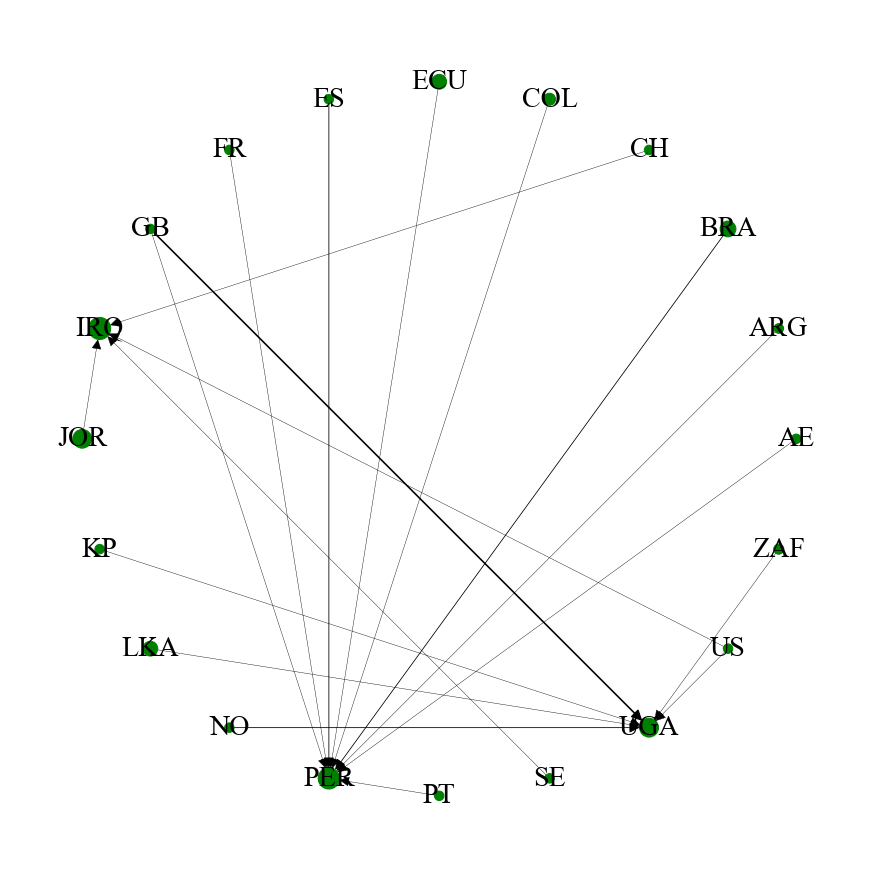

In [115]:
top10_outdegree = list(new_pagerank_merged_data['2005-2009'].sort_values(ascending=False)[:3].index)
top10_number = list(new_pagerank_merged_data['2005-2009'].sort_values(ascending=False)[:3])
target = new_all_weight_country[3]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['2005-2009'].loc[node]*600 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\pagerank4.png", dpi=600)
plt.show()

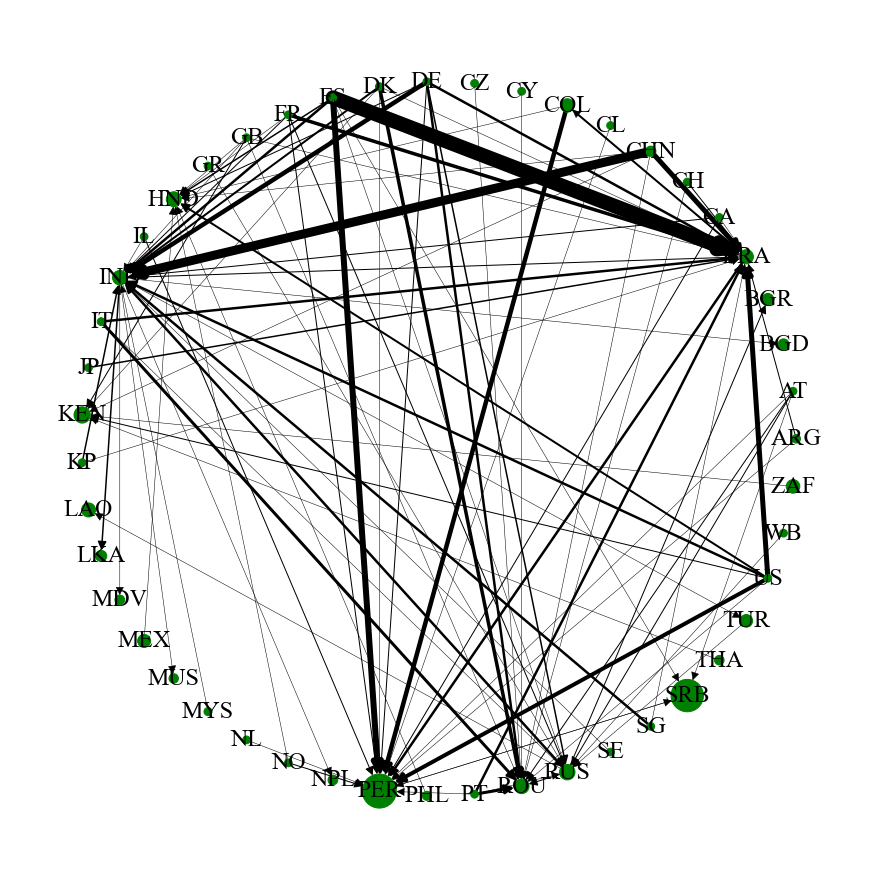

In [157]:
top10_outdegree = list(new_pagerank_merged_data['2010-2014'].sort_values(ascending=False)[:8].index)
top10_number = list(new_pagerank_merged_data['2010-2014'].sort_values(ascending=False)[:8])
target = new_all_weight_country[4]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['2010-2014'].loc[node]*400 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\pagerank5.png", dpi=1000)
plt.show()

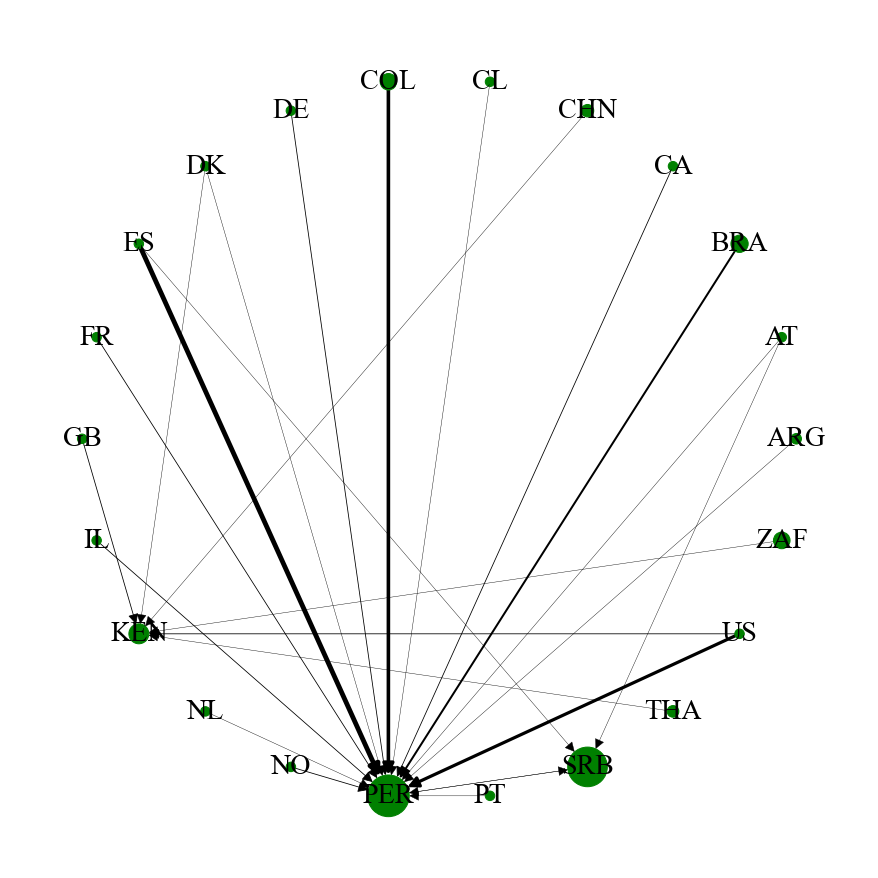

In [116]:
top10_outdegree = list(new_pagerank_merged_data['2010-2014'].sort_values(ascending=False)[:3].index)
top10_number = list(new_pagerank_merged_data['2010-2014'].sort_values(ascending=False)[:3])
target = new_all_weight_country[4]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['2010-2014'].loc[node]*600 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\pagerank5.png", dpi=600)
plt.show()

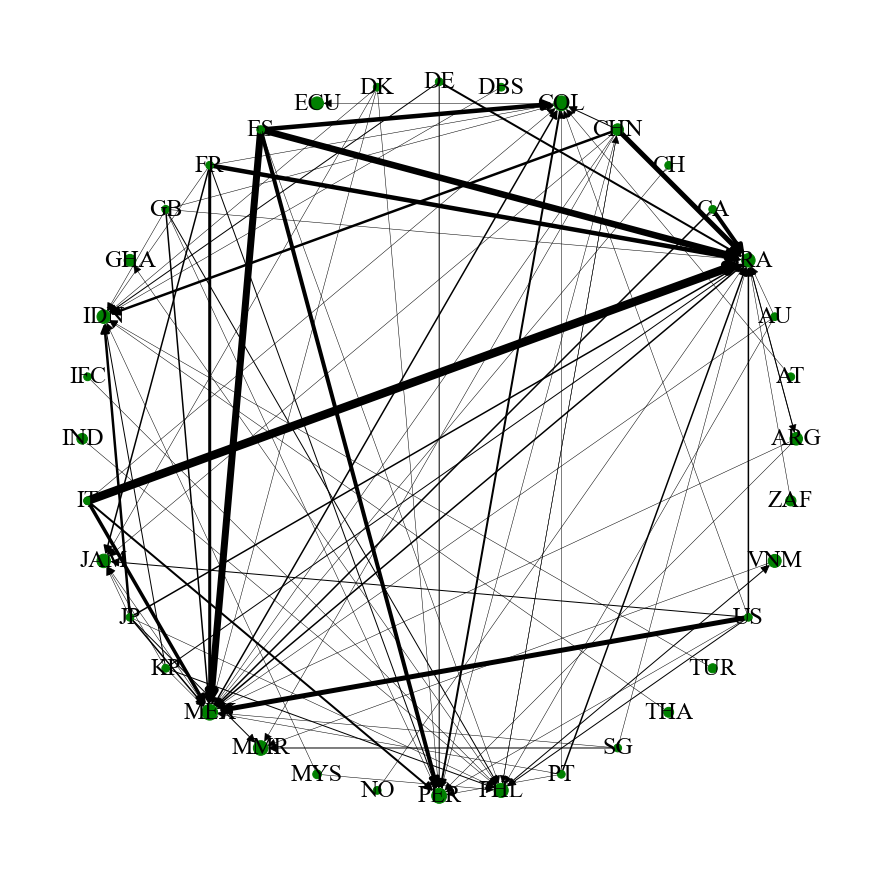

In [158]:
top10_outdegree = list(new_pagerank_merged_data['2015-2019'].sort_values(ascending=False)[:8].index)
top10_number = list(new_pagerank_merged_data['2015-2019'].sort_values(ascending=False)[:8])
target = new_all_weight_country[5]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['2015-2019'].loc[node]*400 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.0 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=24, font_family='times new roman', arrowsize=18)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper2\pagerank6.png", dpi=1000)
plt.show()

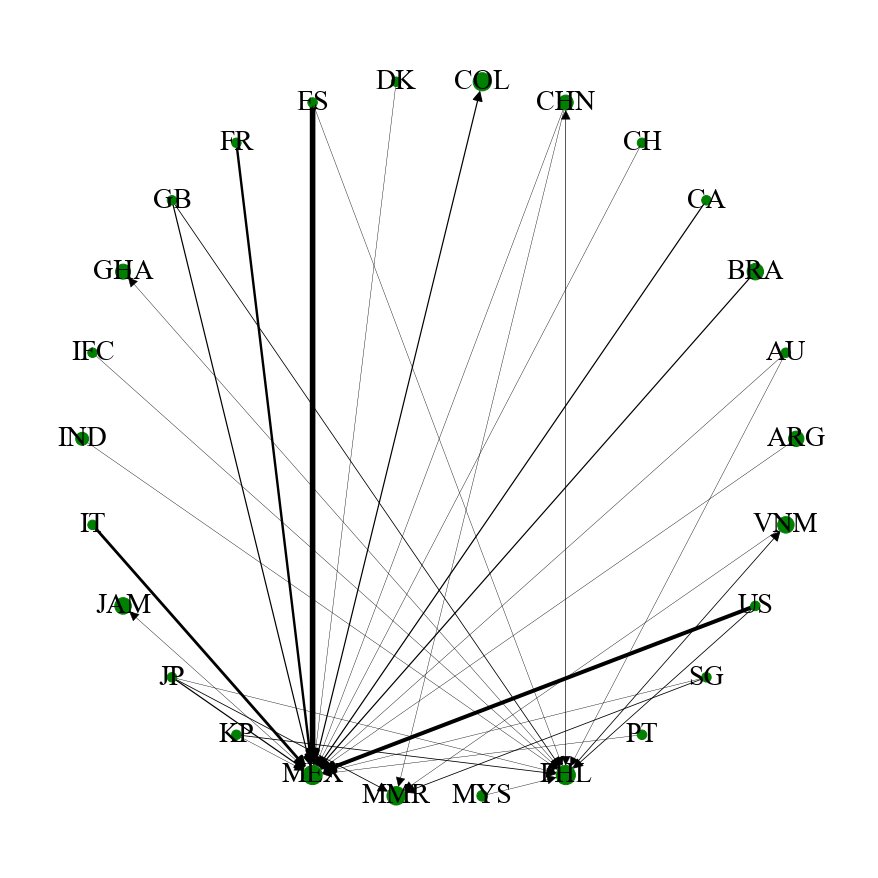

In [117]:
top10_outdegree = list(new_pagerank_merged_data['2015-2019'].sort_values(ascending=False)[:3].index)
top10_number = list(new_pagerank_merged_data['2015-2019'].sort_values(ascending=False)[:3])
target = new_all_weight_country[5]
result = pd.DataFrame(columns=['outcountry', 'weight', 'incountry'])

for country in top10_outdegree:
    result = result.append(target[target['outcountry'] == country])
    result = result.append(target[target['incountry'] == country])
#for network visualization
out_list = list(result['outcountry'].unique())
in_list = list(result['incountry'].unique())
final_list = out_list + in_list

G = nx.DiGraph()
for node in np.unique(final_list):
    G.add_node(str(node))
for i, row in result.iterrows():
    G.add_edge(row['outcountry'], row['incountry'], weight=row['weight'])
    
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
fig.tight_layout(pad=3)

pos = nx.circular_layout(G)
nodes = G.nodes()
node_size = [new_pagerank_merged_data['2015-2019'].loc[node]*600 for node in nodes]
labels = {}
for node in nodes:
    labels[node] = node
edges = G.edges()
weights = [G[u][v]['weight']/2.5 for u,v in edges]
nx.draw(G, pos, edges=edges, width=weights, node_size = node_size, labels=labels, ax=ax,node_color='green',
       font_size=28, font_family='times new roman', arrowsize=22)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig(r"C:\PPP\Thesis\Paper4\pagerank6.png", dpi=600)
plt.show()

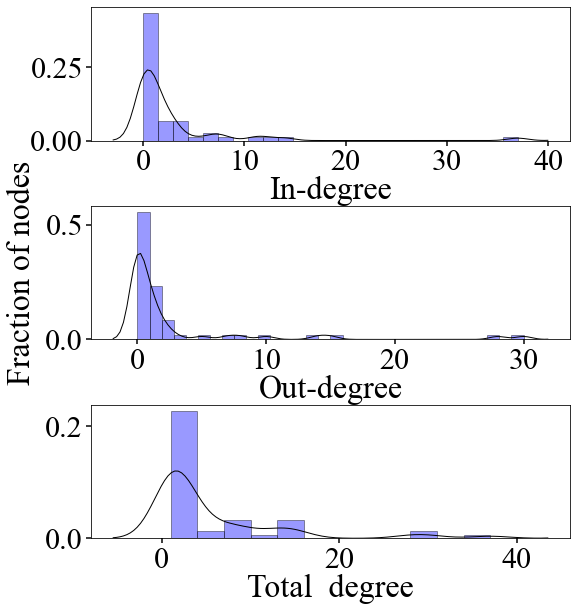

In [678]:
degree_result = indegree_merged_data.merge(outdegree_merged_data, how='outer', left_on = 'country', right_on='country')
fig, axes = plt.subplots(3, 1, figsize=(8, 9), frameon=False)
fig.tight_layout(pad=4.5)
sns.distplot(indegree_merged_data['1990-1994'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[0])
sns.distplot(outdegree_merged_data['1990-1994'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[1])
sns.distplot((degree_result['1990-1994_x'] + degree_result['1990-1994_y']).dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'),  
             ax=axes[2])
for ax, x_label in zip(axes, ['In-degree', 'Out-degree', 'Total  degree']):
    ax.set_xlabel(x_label, fontsize=32, fontname='times new roman', labelpad=0)
    ax.tick_params(axis='both', length=5, labelsize=30, width=1.5, color='black')
    labels = ax.get_xticklabels() + ax.get_yticklabels()
    [label.set_fontname('Times New Roman') for label in labels]

axes[1].set_ylabel("Fraction of nodes", fontsize=32, fontname='times new roman', labelpad=8)

plt.subplots_adjust(left=0.15, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\degreedistribution1.png", dpi=1000)

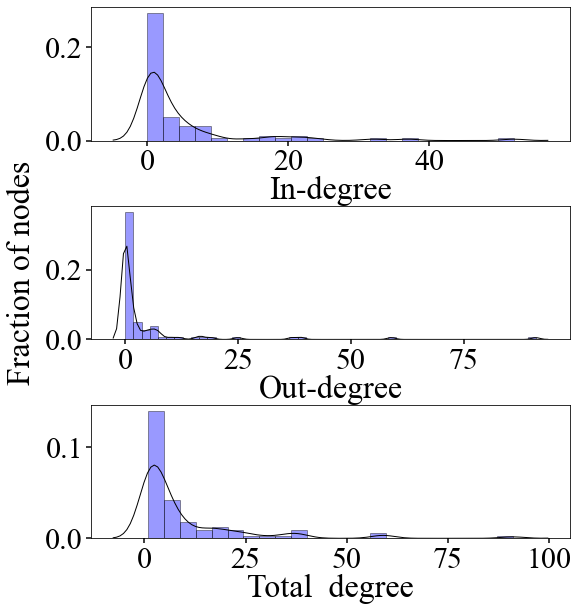

In [679]:
fig, axes = plt.subplots(3, 1, figsize=(8, 9), frameon=False)
fig.tight_layout(pad=4.5)
sns.distplot(indegree_merged_data['1995-1999'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[0])
sns.distplot(outdegree_merged_data['1995-1999'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[1])
sns.distplot((degree_result['1995-1999_x'] + degree_result['1995-1999_y']).dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'),  
             ax=axes[2])
for ax, x_label in zip(axes, ['In-degree', 'Out-degree', 'Total  degree']):
    ax.set_xlabel(x_label, fontsize=32, fontname='times new roman', labelpad=0)
    ax.tick_params(axis='both', length=5, labelsize=30, width=1.5, color='black')
    labels = ax.get_xticklabels() + ax.get_yticklabels()
    [label.set_fontname('Times New Roman') for label in labels]

axes[1].set_ylabel("Fraction of nodes", fontsize=32, fontname='times new roman', labelpad=8)

plt.subplots_adjust(left=0.15, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\degreedistribution2.png", dpi=1000)

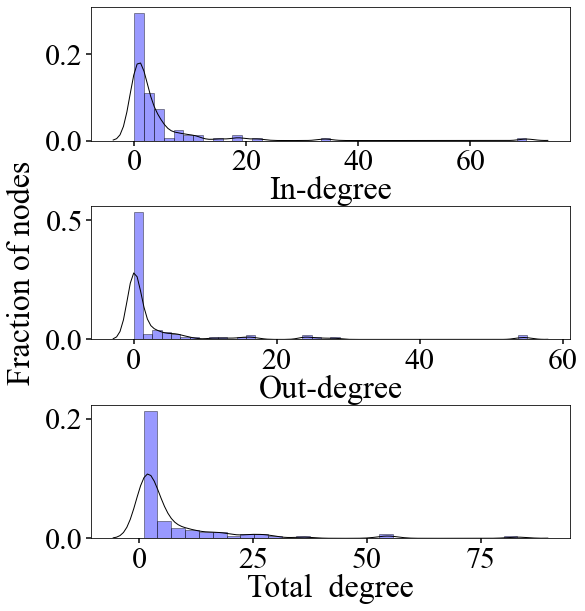

In [680]:
fig, axes = plt.subplots(3, 1, figsize=(8, 9), frameon=False)
fig.tight_layout(pad=4.5)
sns.distplot(indegree_merged_data['2000-2004'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[0])
sns.distplot(outdegree_merged_data['2000-2004'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[1])
sns.distplot((degree_result['2000-2004_x'] + degree_result['2000-2004_y']).dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'),  
             ax=axes[2])
for ax, x_label in zip(axes, ['In-degree', 'Out-degree', 'Total  degree']):
    ax.set_xlabel(x_label, fontsize=32, fontname='times new roman', labelpad=0)
    ax.tick_params(axis='both', length=5, labelsize=30, width=1.5, color='black')
    labels = ax.get_xticklabels() + ax.get_yticklabels()
    [label.set_fontname('Times New Roman') for label in labels]

axes[1].set_ylabel("Fraction of nodes", fontsize=32, fontname='times new roman', labelpad=8)

plt.subplots_adjust(left=0.15, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\degreedistribution3.png", dpi=1000)

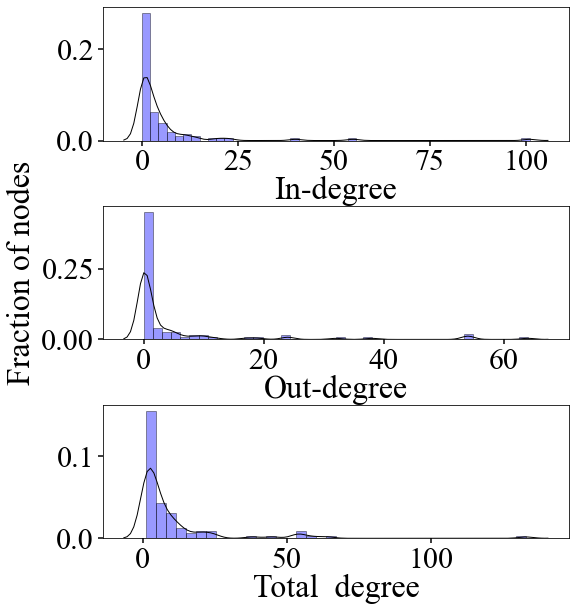

In [691]:
fig, axes = plt.subplots(3, 1, figsize=(8, 9), frameon=False)
fig.tight_layout(pad=4.5)
sns.distplot(indegree_merged_data['2005-2009'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[0])
sns.distplot(outdegree_merged_data['2005-2009'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[1])
sns.distplot((degree_result['2005-2009_x'] + degree_result['2005-2009_y']).dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'),  
             ax=axes[2])
for ax, x_label in zip(axes, ['In-degree', 'Out-degree', 'Total  degree']):
    ax.set_xlabel(x_label, fontsize=32, fontname='times new roman', labelpad=0)
    ax.tick_params(axis='both', length=5, labelsize=30, width=1.5, color='black')
    labels = ax.get_xticklabels() + ax.get_yticklabels()
    [label.set_fontname('Times New Roman') for label in labels]

axes[1].set_ylabel("Fraction of nodes", fontsize=32, fontname='times new roman', labelpad=4)

plt.subplots_adjust(left=0.17, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\degreedistribution4.png", dpi=1000)

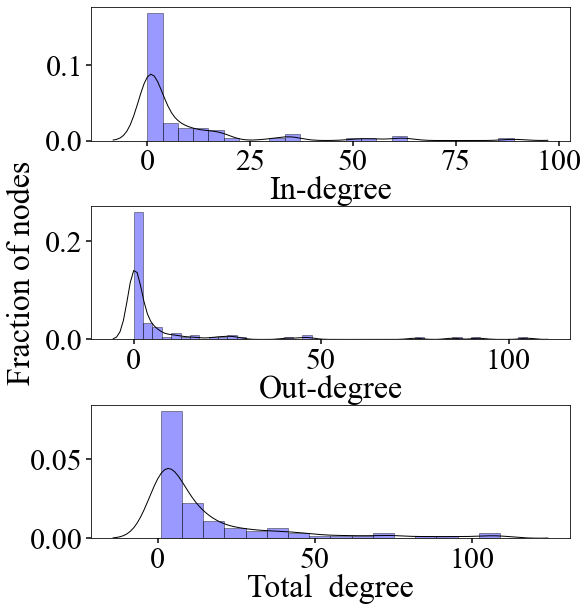

In [682]:
fig, axes = plt.subplots(3, 1, figsize=(8, 9), frameon=False)
fig.tight_layout(pad=4.5)
sns.distplot(indegree_merged_data['2010-2014'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[0])
sns.distplot(outdegree_merged_data['2010-2014'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[1])
sns.distplot((degree_result['2010-2014_x'] + degree_result['2010-2014_y']).dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'),  
             ax=axes[2])
for ax, x_label in zip(axes, ['In-degree', 'Out-degree', 'Total  degree']):
    ax.set_xlabel(x_label, fontsize=32, fontname='times new roman', labelpad=0)
    ax.tick_params(axis='both', length=5, labelsize=30, width=1.5, color='black')
    labels = ax.get_xticklabels() + ax.get_yticklabels()
    [label.set_fontname('Times New Roman') for label in labels]

axes[1].set_ylabel("Fraction of nodes", fontsize=32, fontname='times new roman', labelpad=8)

plt.subplots_adjust(left=0.15, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\degreedistribution5.png", dpi=1000)

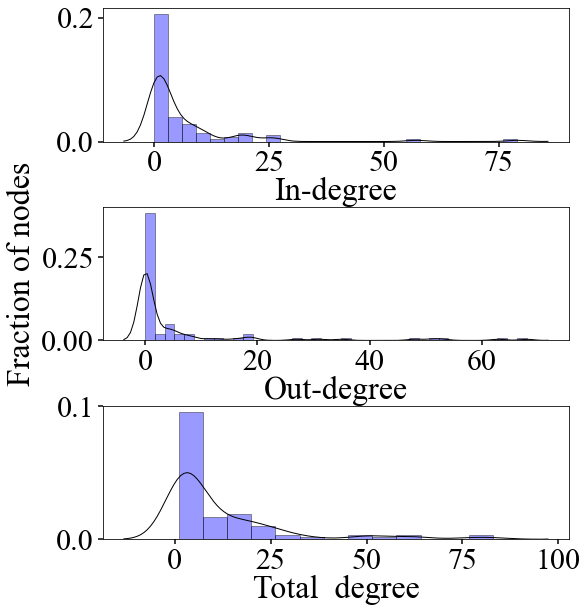

In [690]:
fig, axes = plt.subplots(3, 1, figsize=(8, 9), frameon=False)
fig.tight_layout(pad=4.5)
sns.distplot(indegree_merged_data['2015-2019'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[0])
sns.distplot(outdegree_merged_data['2015-2019'].dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'), 
             ax=axes[1])
sns.distplot((degree_result['2015-2019_x'] + degree_result['2015-2019_y']).dropna(), 
             kde_kws={"color": "k", "lw": 1}, 
             hist_kws=dict(ec="k", color='blue'),  
             ax=axes[2])
for ax, x_label in zip(axes, ['In-degree', 'Out-degree', 'Total  degree']):
    ax.set_xlabel(x_label, fontsize=32, fontname='times new roman', labelpad=0)
    ax.tick_params(axis='both', length=5, labelsize=30, width=1.5, color='black')
    labels = ax.get_xticklabels() + ax.get_yticklabels()
    [label.set_fontname('Times New Roman') for label in labels]

axes[1].set_ylabel("Fraction of nodes", fontsize=32, fontname='times new roman', labelpad=4)

plt.subplots_adjust(left=0.17, right=0.98, top=0.98, bottom=0.16)
plt.savefig(r"C:\PPP\Thesis\Paper2\degreedistribution6.png", dpi=1000)

In [185]:
all_network_30years[0].to_csv(r"C:\PPP\Thesis\Paper2\alldata.csv")

In [187]:
!pip install mpl_toolkits.basemap

  ERROR: Could not find a version that satisfies the requirement mpl_toolkits.basemap (from versions: none)
ERROR: No matching distribution found for mpl_toolkits.basemap


In [2]:
for_map =pd.read_csv(r"C:\PPP\Thesis\Paper2\alldata.csv")

In [5]:
for_map.drop(columns=['Unnamed: 0'], inplace=True)

In [13]:
for_map.replace({'outcountry': 'UK'}, 'United Kingdom', inplace=True)
for_map.replace({'incountry': 'UK'}, 'United Kingdom', inplace=True)

for_map.replace({'outcountry': 'US'}, 'United States of America', inplace=True)
for_map.replace({'incountry': 'US'}, 'United States of America', inplace=True)

for_map.replace({'outcountry': 'United Arab'}, 'United Arab Emirates', inplace=True)
for_map.replace({'incountry': 'United Arab'}, 'United Arab Emirates', inplace=True)


In [39]:
all_outdegree = all_out_degree[0].copy()

In [47]:
all_outdegree.replace({'n.name': 'UK'}, 'United Kingdom', inplace=True)

all_outdegree.replace({'n.name': 'US'}, 'United States of America', inplace=True)

all_outdegree.replace({'n.name': 'United Arab'}, 'United Arab Emirates', inplace=True)

In [49]:
import geopandas as gpd
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [53]:
map_of_flow = world.merge(all_outdegree, how='left', left_on='name', right_on='n.name')

In [54]:
map_of_flow

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,n.name,year
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",NaN,NaN
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",Tanzania,0.0
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",NaN,NaN
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",Canada,76.0
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",United States of America,353.0
...,...,...,...,...,...,...,...,...
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888...",Serbia,1.0
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",Montenegro,0.0
174,1895250,Europe,Kosovo,-99,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",Kosovo,0.0
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",NaN,NaN


In [59]:
for_map

,outcountry,weight,incountry
0,Germany,1,Azerbaijan
1,United Kingdom,1,Afghanistan
2,China,1,Montenegro
3,China,1,Zimbabwe
4,Spain,1,Paraguay
...,...,...,...
810,Malaysia,1,Maldives
811,India,1,Maldives
812,France,1,Guinea-Bissau
813,Portugal,1,São Tomé and Principe


In [112]:
country_list = list(for_map['outcountry'].unique()) + list(for_map['incountry'].unique())

pts = np.array([(pt.x, pt.y) for pt in world.centroid])
country = np.array(world.name)
country_centroid = {countryname: centroid for countryname, centroid in zip(country, pts)}

for country in country_list:
    if country not in country_centroid:
        country_list.remove(country)

In [113]:
country_list.remove('Czech Republic')

In [114]:
country_list

['Germany',
 'United Kingdom',
 'China',
 'Spain',
 'France',
 'Brazil',
 'Norway',
 'Japan',
 'Italy',
 'Philippines',
 'Chile',
 'Belgium',
 'Canada',
 'United States of America',
 'Denmark',
 'Malaysia',
 'Finland',
 'Switzerland',
 'Sweden',
 'Netherlands',
 'Australia',
 'Portugal',
 'Argentina',
 'Colombia',
 'Indonesia',
 'Austria',
 'Thailand',
 'Israel',
 'Russia',
 'South Africa',
 'United Arab Emirates',
 'Turkey',
 'Greece',
 'Saudi Arabia',
 'Ireland',
 'Mexico',
 'India',
 'New Zealand',
 'Vietnam',
 'Bulgaria',
 'Kuwait',
 'Sri Lanka',
 'Cyprus',
 'Serbia',
 'Ecuador',
 'Nepal',
 'Jordan',
 'Peru',
 'Azerbaijan',
 'Afghanistan',
 'Montenegro',
 'Zimbabwe',
 'Paraguay',
 'Mauritania',
 'Argentina',
 'Thailand',
 'Mexico',
 'China',
 'India',
 "Côte d'Ivoire",
 'Indonesia',
 'Russia',
 'South Africa',
 'Malaysia',
 'Colombia',
 'Philippines',
 'Algeria',
 'Bulgaria',
 'Tanzania',
 'Tunisia',
 'Brazil',
 'Costa Rica',
 'Vietnam',
 'Jamaica',
 'Turkey',
 'Georgia',
 'Guatema

In [115]:
country_centroid

{'Fiji': array([163.85316464, -17.31630943]),
 'Tanzania': array([34.75298985, -6.25773243]),
 'W. Sahara': array([-12.13783111,  24.29117296]),
 'Canada': array([-98.14238137,  61.46907615]),
 'United States of America': array([-112.59943591,   45.705628  ]),
 'Kazakhstan': array([67.28461098, 48.19166075]),
 'Uzbekistan': array([63.20363953, 41.74860266]),
 'Papua New Guinea': array([145.31757463,  -6.45164451]),
 'Indonesia': array([117.42340756,  -2.22173794]),
 'Argentina': array([-65.17536077, -35.44682149]),
 'Chile': array([-71.52064395, -39.04701431]),
 'Dem. Rep. Congo': array([23.58295583, -2.85027571]),
 'Somalia': array([45.72670077,  4.75234776]),
 'Kenya': array([37.79155529,  0.59596625]),
 'Sudan': array([29.86260401, 15.990585  ]),
 'Chad': array([18.58132953, 15.3288674 ]),
 'Haiti': array([-72.65801331,  18.90070069]),
 'Dominican Rep.': array([-70.46235846,  18.88448709]),
 'Russia': array([96.80331818, 61.96166349]),
 'Bahamas': array([-77.9299708 ,  25.51549173])

In [179]:
G = nx.MultiDiGraph()
for node in np.unique(country_list):
    G.add_node(str(node))
for i, row in for_map.iterrows():
    if (row['outcountry'] in country_list) &(row['incountry'] in country_list):
        for _ in np.arange(row['weight']):
            G.add_edge(row['outcountry'], row['incountry'])

In [181]:
edges = G.edges

In [183]:
len(edges)

2375

C:\Anaconda\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
C:\Anaconda\lib\site-packages\networkx\drawing\nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


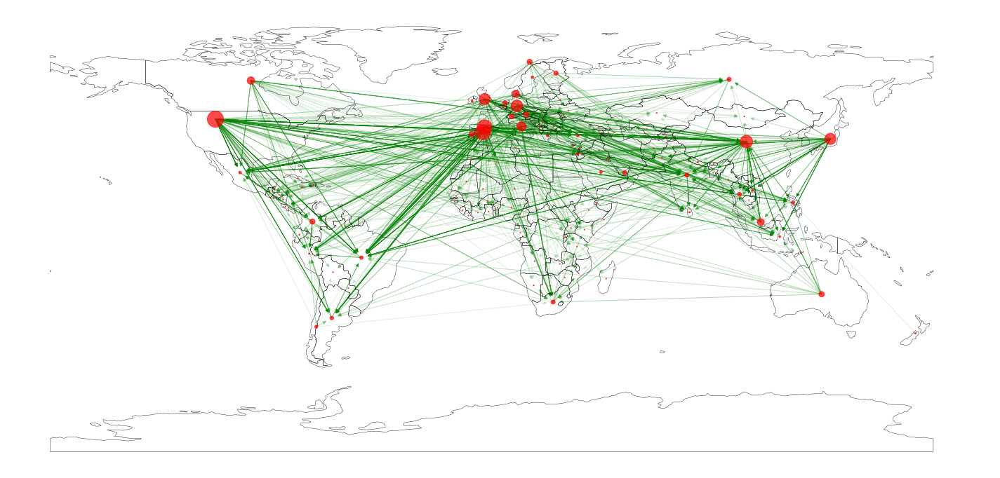

In [190]:
fig = plt.figure(figsize=(20, 12))
ax = fig.add_subplot(111)
ax.set_axis_off()
world.boundary.plot(ax=ax, linewidth=0.4, edgecolor='black')
all_outdegree_newindex = all_outdegree.copy()

all_outdegree_newindex.set_index('n.name', inplace=True)
edges = G.edges
node_size = [(all_outdegree_newindex.loc[node] + 1)*1.5 for node in G.nodes]


nx.draw_networkx_nodes(G, country_centroid, node_list = G.nodes(), node_color='red', node_size=node_size, alpha=0.7)
nx.draw_networkx_edges(G, country_centroid, edge_color='g', alpha=0.12, arrows=True)


plt.subplots_adjust(left=0.01, right=0.99, top=0.99, bottom=0.01)
plt.savefig(r"C:\PPP\Thesis\Paper2\flowofknowledge.png", dpi=1000)

In [169]:
len(weights)

660

In [176]:
country_centroid

{'Fiji': array([163.85316464, -17.31630943]),
 'Tanzania': array([34.75298985, -6.25773243]),
 'W. Sahara': array([-12.13783111,  24.29117296]),
 'Canada': array([-98.14238137,  61.46907615]),
 'United States of America': array([-112.59943591,   45.705628  ]),
 'Kazakhstan': array([67.28461098, 48.19166075]),
 'Uzbekistan': array([63.20363953, 41.74860266]),
 'Papua New Guinea': array([145.31757463,  -6.45164451]),
 'Indonesia': array([117.42340756,  -2.22173794]),
 'Argentina': array([-65.17536077, -35.44682149]),
 'Chile': array([-71.52064395, -39.04701431]),
 'Dem. Rep. Congo': array([23.58295583, -2.85027571]),
 'Somalia': array([45.72670077,  4.75234776]),
 'Kenya': array([37.79155529,  0.59596625]),
 'Sudan': array([29.86260401, 15.990585  ]),
 'Chad': array([18.58132953, 15.3288674 ]),
 'Haiti': array([-72.65801331,  18.90070069]),
 'Dominican Rep.': array([-70.46235846,  18.88448709]),
 'Russia': array([96.80331818, 61.96166349]),
 'Bahamas': array([-77.9299708 ,  25.51549173])

In [ ]:
nx.draw(G, 
        country_centroid, 
        edges=edges, 
        ax=ax,
        node_color='green',
        font_size=24, 
        font_family='times new roman', 
        arrowsize=18)


In [27]:
pts

array([[ 163.85316464,  -17.31630943],
       [  34.75298985,   -6.25773243],
       [ -12.13783111,   24.29117296],
       [ -98.14238137,   61.46907615],
       [-112.59943591,   45.705628  ],
       [  67.28461098,   48.19166075],
       [  63.20363953,   41.74860266],
       [ 145.31757463,   -6.45164451],
       [ 117.42340756,   -2.22173794],
       [ -65.17536077,  -35.44682149],
       [ -71.52064395,  -39.04701431],
       [  23.58295583,   -2.85027571],
       [  45.72670077,    4.75234776],
       [  37.79155529,    0.59596625],
       [  29.86260401,   15.990585  ],
       [  18.58132953,   15.3288674 ],
       [ -72.65801331,   18.90070069],
       [ -70.46235846,   18.88448709],
       [  96.80331818,   61.96166349],
       [ -77.9299708 ,   25.51549173],
       [ -59.42097279,  -51.71322177],
       [  15.46811996,   69.15685631],
       [ -41.50018111,   74.77048769],
       [  69.53158047,  -49.30645491],
       [ 125.96630027,   -8.76776036],
       [  25.04801388,  -

In [60]:
world.centroid

0      POINT (163.85316 -17.31631)
1        POINT (34.75299 -6.25773)
2       POINT (-12.13783 24.29117)
3       POINT (-98.14238 61.46908)
4      POINT (-112.59944 45.70563)
                  ...             
172      POINT (20.81965 44.23304)
173      POINT (19.28618 42.78904)
174      POINT (20.89536 42.57937)
175     POINT (-61.33037 10.42824)
176       POINT (30.19862 7.29289)
Length: 177, dtype: geometry

In [62]:
world.name

0                          Fiji
1                      Tanzania
2                     W. Sahara
3                        Canada
4      United States of America
                 ...           
172                      Serbia
173                  Montenegro
174                      Kosovo
175         Trinidad and Tobago
176                    S. Sudan
Name: name, Length: 177, dtype: object

In [66]:
country_centroid

{'Fiji': array([163.85316464, -17.31630943]),
 'Tanzania': array([34.75298985, -6.25773243]),
 'W. Sahara': array([-12.13783111,  24.29117296]),
 'Canada': array([-98.14238137,  61.46907615]),
 'United States of America': array([-112.59943591,   45.705628  ]),
 'Kazakhstan': array([67.28461098, 48.19166075]),
 'Uzbekistan': array([63.20363953, 41.74860266]),
 'Papua New Guinea': array([145.31757463,  -6.45164451]),
 'Indonesia': array([117.42340756,  -2.22173794]),
 'Argentina': array([-65.17536077, -35.44682149]),
 'Chile': array([-71.52064395, -39.04701431]),
 'Dem. Rep. Congo': array([23.58295583, -2.85027571]),
 'Somalia': array([45.72670077,  4.75234776]),
 'Kenya': array([37.79155529,  0.59596625]),
 'Sudan': array([29.86260401, 15.990585  ]),
 'Chad': array([18.58132953, 15.3288674 ]),
 'Haiti': array([-72.65801331,  18.90070069]),
 'Dominican Rep.': array([-70.46235846,  18.88448709]),
 'Russia': array([96.80331818, 61.96166349]),
 'Bahamas': array([-77.9299708 ,  25.51549173])

In [6]:
data_for_network.head(10)

,IY,country,Region,sector,ssector,PCO,government_involve,foreign_country,sponsor_number,foreign_fund
0,1990,Argentina,LAC,Transport,Toll Roads,N/N/6,N,N,6,NaN
2,1990,Thailand,EAP,Transport,Seaports,N/N/4,N,N,4,NaN
3,1990,Thailand,EAP,ICT,Telecom,N/N/1,N,N,1,NaN
4,1990,Mexico,LAC,Transport,Toll Roads,N/N/3/Local Bank,N,N,3,Local Bank
5,1990,Mexico,LAC,Transport,Toll Roads,N/N/7,N,N,7,NaN
6,1990,Mexico,LAC,Transport,Toll Roads,N/N/2,N,N,2,NaN
8,1990,Argentina,LAC,ICT,Telecom,N/N/3,N,N,3,NaN
9,1990,China,EAP,Transport,Toll Roads,N/N/1/Local Bank,N,N,1,Local Bank
10,1990,Argentina,LAC,Transport,Toll Roads,N/Spain/4/Local Government,N,Spain,4,Local Government
11,1990,India,SAR,Transport,Toll Roads,N/N/1,N,N,1,NaN


In [8]:
data_for_network.Region.unique()

array(['LAC', 'EAP', 'SAR', 'AFR', 'ECA', 'MENA'], dtype=object)

In [47]:
new_data_flow = data_for_network[['Region', 'foreign_country']]

In [48]:
new_data_flow = new_data_flow[new_data_flow['foreign_country'] != 'N']

In [49]:
stringlist = ['(Construction)', '(Equipment)', '(Legal_Adviser)', '(Financial_Adviser)']

In [50]:
new_data_flow.foreign_country = new_data_flow.foreign_country.map(lambda x: x.replace('(Construction)', ''))

In [51]:
new_data_flow.foreign_country = new_data_flow.foreign_country.map(lambda x: x.replace('(Equipment)', ''))

In [52]:
new_data_flow.foreign_country = new_data_flow.foreign_country.map(lambda x: x.replace('(Legal_Adviser)', ''))
new_data_flow.foreign_country = new_data_flow.foreign_country.map(lambda x: x.replace('(Financial_Adviser)', ''))

In [63]:
new_data_flow

,Region,foreign_country
10,LAC,Spain
14,AFR,France
16,EAP,US
17,LAC,UK
21,ECA,France
...,...,...
7073,ECA,Spain
7076,LAC,China
7082,LAC,Italy
7085,MENA,Italy


In [107]:
all_countryname = []
for i in new_data_flow.index.values:
    if not ',' in new_data_flow.loc[i, 'foreign_country']:
        all_countryname.append(new_data_flow.loc[i, 'foreign_country'])
    else:
        for country in new_data_flow.loc[i, 'foreign_country'].split(','):
            all_countryname.append(country)

In [108]:
all_countryname = [i.lstrip() for i in all_countryname]
all_countryname = [i.rstrip() for i in all_countryname]
all_countryname = list(dict.fromkeys(all_countryname))

In [310]:
all_countryname

['Spain',
 'France',
 'US',
 'UK',
 'IFC',
 'Netherlands',
 'Japan',
 'Canada',
 'Italy',
 'Sweden',
 'Singapore',
 'Belgium',
 'Germany',
 'Chile',
 'Finland',
 'Philippines',
 'Mexico',
 'Malaysia',
 'Indonesia',
 'Norway',
 'ADB',
 'Australia',
 'Austria',
 'Switzerland',
 'Portugal',
 'Thailand',
 'China',
 'Korea',
 'Russia',
 'Greece',
 'Denmark',
 'Israel',
 'South Africa',
 'India',
 'Argentina',
 'United Arab',
 'EIB',
 'World Bank',
 'Colombia',
 'Brazil',
 'Ireland',
 'Vietnam',
 'Saudi Arabia',
 'Kuwait',
 'Nepal',
 'AIIM',
 'Jordan',
 'Sri Lanka',
 'Ecuador',
 'Czech Republic',
 'Turkey',
 'New Zealand',
 'EBRD',
 'Cyprus',
 'Serbia',
 'Peru',
 'DBS',
 'Bulgaria']

In [311]:
from collections import defaultdict

In [334]:
counts = defaultdict(lambda: 0)
data = new_data_flow.groupby(['Region', 'foreign_country']).size()['LAC']
for i in data.index.values:
    for j in all_countryname:
        if j in i:
            counts[j] += data.loc[i]

In [313]:
new_data_flow.head()

,Region,foreign_country
10,LAC,Spain
14,AFR,France
16,EAP,US
17,LAC,UK
21,ECA,France


In [314]:
MENA = counts.copy()

In [327]:
EAP = counts.copy()

In [318]:
SAR = counts.copy()

In [323]:
ECA = counts.copy()

In [331]:
AFR = counts.copy()

In [335]:
LAC = counts.copy()

In [316]:
MENA_frame = pd.DataFrame(MENA.values(), index=MENA.keys(), columns=['MENA'])
MENA_frame.index.name = 'country'

In [320]:
SAR_frame = pd.DataFrame(SAR.values(), index=SAR.keys(), columns=['SAR'])
SAR_frame.index.name = 'country'

In [324]:
ECA_frame = pd.DataFrame(ECA.values(), index=ECA.keys(), columns=['ECA'])
ECA_frame.index.name = 'country'

In [328]:
EAP_frame = pd.DataFrame(EAP.values(), index=EAP.keys(), columns=['EAP'])
EAP_frame.index.name = 'country'

In [332]:
AFR_frame = pd.DataFrame(AFR.values(), index=AFR.keys(), columns=['AFR'])
AFR_frame.index.name = 'country'

In [336]:
LAC_frame = pd.DataFrame(LAC.values(), index=LAC.keys(), columns=['LAC'])
LAC_frame.index.name = 'country'

In [338]:
final_frame = MENA_frame.merge(SAR_frame, left_on='country', right_on='country', how='outer')

,MENA,SAR
country,,
Canada,6.0,3.0
China,9.0,58.0
Spain,17.0,15.0
Switzerland,6.0,6.0
Korea,7.0,8.0
Saudi Arabia,5.0,2.0
Denmark,5.0,7.0
UK,12.0,30.0
IFC,2.0,10.0


In [340]:
final_frame = final_frame.merge(ECA_frame, left_on='country', right_on='country', how='outer')
final_frame = final_frame.merge(EAP_frame, left_on='country', right_on='country', how='outer')
final_frame = final_frame.merge(AFR_frame, left_on='country', right_on='country', how='outer')
final_frame = final_frame.merge(LAC_frame, left_on='country', right_on='country', how='outer')

In [341]:
final_frame.fillna(0, inplace=True)

In [342]:
final_frame['total_number'] = final_frame.sum(axis=1)

In [343]:
final_frame.sort_values(by=['total_number'])

,MENA,SAR,ECA,EAP,AFR,LAC,total_number
country,,,,,,,
Serbia,0.0,0.0,0.0,0.0,0.0,1.0,1.0
Ecuador,0.0,0.0,0.0,0.0,0.0,1.0,1.0
Kuwait,1.0,0.0,0.0,0.0,0.0,0.0,1.0
Cyprus,0.0,0.0,1.0,0.0,0.0,0.0,1.0
Belgium,0.0,0.0,0.0,0.0,0.0,1.0,1.0
Nepal,0.0,1.0,0.0,0.0,0.0,0.0,1.0
Peru,0.0,0.0,1.0,0.0,0.0,0.0,1.0
EIB,0.0,0.0,0.0,0.0,1.0,0.0,1.0
Bulgaria,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [344]:
new_data_flow.foreign_country.value_counts()

US                       230
Spain                    223
France                   210
China                    148
Germany                  113
                        ... 
India,Nepal,Japan          1
Singapore,China            1
India,Korea,UK             1
Japan,US,France,Japan      1
US,UK,Netherlands          1
Name: foreign_country, Length: 320, dtype: int64

In [353]:
final_frame['total_number'].sum()

2729.0

In [345]:
data.shape

(119,)

In [291]:
data_for_network[data_for_network['foreign_country'] != 'N']

,IY,country,Region,sector,ssector,PCO,government_involve,foreign_country,sponsor_number,foreign_fund
10,1990,Argentina,LAC,Transport,Toll Roads,N/Spain/4/Local Government,N,Spain,4,Local Government
14,1990,Côte d'Ivoire,AFR,Energy,Electricity,N/France/4,N,France,4,NaN
16,1991,China,EAP,Transport,Toll Roads,Y/US/2,Y,US,2,NaN
17,1991,Argentina,LAC,Water and sewerage,Water Utility,N/UK/2/Local Bank,N,UK,2,Local Bank
21,1991,Russia,ECA,ICT,Telecom,N/France/4,N,France,4,NaN
...,...,...,...,...,...,...,...,...,...,...
7073,2019,Russia,ECA,Municipal Solid Waste,Integrated MSW,N/Spain/1,N,Spain,1,NaN
7076,2019,Colombia,LAC,Energy,Electricity,N/China/1/Local Bank,N,China,1,Local Bank
7082,2019,Brazil,LAC,Energy,Electricity,N/Italy/1,N,Italy,1,NaN
7085,2019,Tunisia,MENA,Energy,Electricity,Y/Italy/2,Y,Italy,2,NaN


In [346]:
final_frame['AFR'].sum()

302.0

In [347]:
final_frame['EAP'].sum()

686.0

In [348]:
final_frame['ECA'].sum()

314.0

In [349]:
final_frame['LAC'].sum()

913.0

In [350]:
final_frame['MENA'].sum()

176.0

In [351]:
final_frame['SAR'].sum()

338.0

In [352]:
data_for_network[data_for_network['foreign_country'] != 'N'].groupby('Region').size()

Region
AFR     250
EAP     562
ECA     259
LAC     764
MENA    122
SAR     274
dtype: int64

In [308]:
data_for_network[(data_for_network['foreign_country'] != 'N') & (data_for_network['Region'] == 'SAR')].foreign_country.values

array(['US', 'Norway,IFC,ADB', 'UK', 'Italy',
       'IFC,Finland,Switzerland(Equipment)', 'US', 'UK',
       'IFC,Japan(Construction)', 'Japan', 'IFC,Finland', 'China',
       'Finland', 'France(Equipment)', 'IFC', 'Thailand', 'IFC,UK', 'US',
       'ADB', 'US,Philippines', 'Switzerland', 'Australia', 'Finland,US',
       'Germany(Construction)', 'Japan', 'Korea,UK', 'Singapore', 'Japan',
       'US', 'Japan', 'US,Switzerland(Construction)', 'US,Malaysia',
       'Malaysia', 'Netherlands', 'Italy(Construction)',
       'Finland(Construction),US', 'UK,US', 'Finland(Construction),US',
       'Singapore', 'Switzerland,Germany(Equipment)',
       'China(Equipment),UK(Equipment),India(Equipment)', 'Malaysia',
       'US', 'Singapore', 'Australia', 'US', 'UK,Finland,India',
       'Austria', 'World Bank', 'India', 'Malaysia', 'Malaysia',
       'Germany(Equipment),Japan(Construction)', 'Malaysia',
       'China(Equipment),Italy(Equipment),India(Equipment)',
       'Singapore,United Arab', '

In [251]:
data_for_network[data_for_network['foreign_country'] != 'N'].groupby(['Region', 'sector', 'ssector']).size()

Region  sector                 ssector                 
AFR     Energy                 Electricity                 164
                               Natural Gas                   3
        ICT                    Telecom                       8
        Transport              Airports                      7
                               Railroads                    12
                               Seaports                     31
                               Toll Roads                    5
        Water and sewerage     Treatment plant               6
                               Water Utility                14
EAP     Energy                 Electricity                 295
                               Natural Gas                   3
        ICT                    Telecom                      12
        Municipal Solid Waste  Treatment/ Disposal           6
        Transport              Airports                     10
                               Railroads                     4

In [252]:
data_for_network.groupby(['Region', 'sector', 'ssector']).size()

Region  sector                 ssector            
AFR     Energy                 Electricity            223
                               Natural Gas              4
        ICT                    Telecom                 12
        Municipal Solid Waste  Treatment/ Disposal      2
        Transport              Airports                10
                                                     ... 
SAR     Transport              Railroads                7
                               Seaports                41
                               Toll Roads             226
        Water and sewerage     Treatment plant          9
                               Water Utility           12
Length: 68, dtype: int64

In [253]:
data.groupby('sector').size()

sector
Energy                   3599
ICT                       134
Municipal Solid Waste     418
Transport                1893
Water and sewerage       1052
dtype: int64

In [5]:
transport = pd.read_csv(r"C:\Users\Meghdad\Desktop\dd\Transpportoutdegree.csv")
ICT = pd.read_csv(r"C:\Users\Meghdad\Desktop\dd\ICToutdegree.csv")
Energy = pd.read_csv(r"C:\Users\Meghdad\Desktop\dd\Energyoutdegree.csv")
Water = pd.read_csv(r"C:\Users\Meghdad\Desktop\dd\Wateroutdegree.csv")
MSW = pd.read_csv(r"C:\Users\Meghdad\Desktop\dd\Solidoutdegree.csv")

In [12]:
r1 = transport.merge(ICT, how='inner', on='country')
r2 = r1.merge(Energy, how='inner', on='country')
r3 = r2.merge(Water, how='inner', on='country')
r4 = r3.merge(MSW, how='inner', on='country')

In [14]:
sns.r4.corr()

,1_x,1_y,1_x,1_y,1
1_x,1.000000,0.951052,0.846376,0.734031,0.581038
1_y,0.951052,1.000000,0.821384,0.772974,0.678545
1_x,0.846376,0.821384,1.000000,0.389627,0.413801
1_y,0.734031,0.772974,0.389627,1.000000,0.773526
1,0.581038,0.678545,0.413801,0.773526,1.000000


In [15]:
r4

,country,1_x,1_y,1_x,1_y,1
0,US,57.0,10.0,247.0,38.0,1.0
1,IFC,5.0,1.0,26.0,2.0,3.0
2,France,47.0,10.0,116.0,112.0,8.0
3,Canada,14.0,2.0,57.0,2.0,1.0
4,Singapore,28.0,3.0,39.0,55.0,1.0
5,Japan,13.0,2.0,142.0,13.0,2.0
6,Italy,18.0,3.0,87.0,7.0,1.0
7,Korea,4.0,2.0,45.0,6.0,1.0
8,Thailand,2.0,1.0,18.0,0.0,0.0
9,Mexico,5.0,1.0,1.0,1.0,1.0


In [16]:
transport

,country,1
0,Serbia,0.0
1,Paraguay,0.0
2,Mauritania,0.0
3,Spain,84.0
4,US,57.0
...,...,...
94,Sierra Leone,0.0
95,Somalia,0.0
96,Guatemala,0.0
97,"Yemen, Rep.",0.0


In [17]:
kims_bim_element_status = pd.read_sql(r"C:\Users\Meghdad\Desktop\kims_bim_element_status.sql")

TypeError: read_sql() missing 1 required positional argument: 'con'